>NAME - VAIBHAV ARORA   
>id - vaibhav.arora@praxis.ac.in

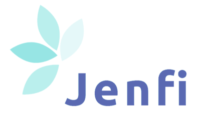

# Content Overview

1.   Dataset Overview

2.   Problem Statement

3.   Methodology

4.   Workflow

5.   Import Libraries

6.   Load Dataset

7.   Auto EDA

8.   Mannual EDA

9.   Data preprocessing

10.   Auto ML

11.   Mannual ML

12.   Hyperparameter Tunning

13.   Model Interpretation

14.   OOT_data Prediction Probability

# Dataset Overview

Data Features range from M1-M151. Target column is named as target.



Datset is a noisy with major null,infinity,outlier with multi-collinearity.

# Problem Statement

Binary Classification and predicting probability of a given OOT Dataset.

# Workflow

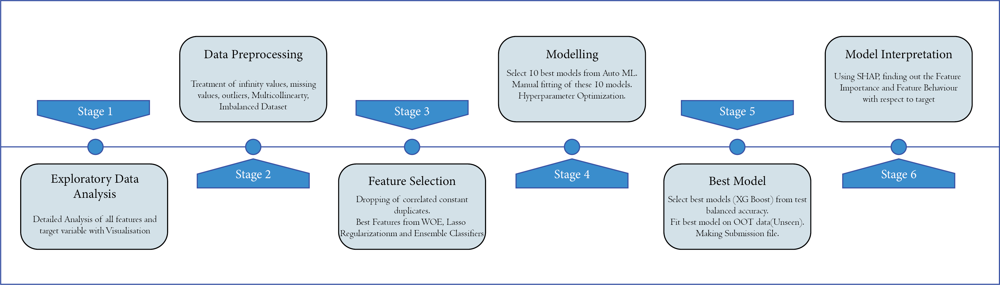

# Methodology

***Step 1***.Understanding the problem statement.

***Step 2***.Overview of features.

***Step 3***.Performed Exploratory Data Analysis under which Deep Analysis of features and Target Variable, and Statiscal analysis has been done as well as Auto EDA through ***dtale*** library.

***Step 4***.Data Pre-Processing - Dropping Unnecessary Variables, Treatment of Missing Values, Outlier treatment

***Step 5*** Standardization and checking for multi-collinearity.

***Step 6*** Treatement of Imbalanced Dataset by SMOTE.

***Step 7*** Feature Engine for feature elimination - Dropping of correlated,constant and duplicates.

***Step 8*** Weight of Evidence - best features

***Step 9*** Lasso Regularization - best features

***Step 10*** Feature Importance by tree classifier.

***Step 11*** Auto ML - find out 10 best Models - Using ***Pycaret***

***Step 12*** Model fitting - Used best 10 best algorithms for this dataset

***Step 13*** Performed Hypperparameter Optimization.

***Step 14*** Select Best Model according to Test Data Accuracy

***Step 15*** Model Interpretation using SHAP

***Step 16*** Fit Best Model on OOT Data(unseen)

***Step 17*** Submission of excel of Predict Prob of OOT Data


# Import Libraries

## Pip install

In [1]:
from IPython.display import clear_output
!pip install dtale
!pip install pingouin
!pip install feature_engine
!pip install -U --pre pycaret
!pip install fancyimpute
!pip install shap
clear_output()

## Libraries

In [3]:
# Importing Libraries
import pandas as pd
import requests
from pycaret.classification import setup, compare_models, pull, finalize_model, blend_models, predict_model, models, plot_model
import io
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
import lightgbm as lgb
from sklearn.preprocessing import KBinsDiscretizer
from scipy.stats import chi2_contingency
import math
from sklearn.inspection import permutation_importance
from fancyimpute import KNN
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
import numpy as np
import matplotlib.pyplot as plt
from fancyimpute import IterativeImputer
import seaborn as sns
import pingouin as pg
import warnings
from sklearn.impute import SimpleImputer
from scipy.stats import skew, kurtosis
warnings.filterwarnings('ignore')
from sklearn.ensemble import RandomForestClassifier
%matplotlib inline
from scipy.stats import pointbiserialr
from sklearn.model_selection import train_test_split
from feature_engine.selection import (
    DropDuplicateFeatures,
    DropConstantFeatures,
    DropDuplicateFeatures,
    DropCorrelatedFeatures,
    SmartCorrelatedSelection,
    SelectByShuffling,
    SelectBySingleFeaturePerformance,
    RecursiveFeatureElimination,
)
from sklearn.ensemble import ExtraTreesClassifier
import dtale
from statsmodels.graphics.gofplots import qqplot
import dtale.app as dtale_app 
from scipy.stats import norm
import scipy
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from sklearn.linear_model import HuberRegressor
from imblearn.over_sampling import SMOTE
import missingno as mso
from statsmodels.graphics.mosaicplot import mosaic
from pycaret.classification import *
from scipy.stats import f_oneway

# Load Dataset

In [4]:
# Load the dataset mannualy

# train = pd.read_csv("Training_data_Jenfi_assessment_070423.csv")
# test = pd.read_csv("Test_data_Jenfi_assessment_070423.csv")
# OOT_data = pd.read_csv("OOT_data_Jenfi_assessment_070423.csv")

In [331]:
# No need to dowload datasets separately
# run these code to extract data from github
# this are the datasets provided by Jenfi

gt_train_url = "https://raw.githubusercontent.com/VaibhavArora13/Jenfi-/main/Training_data_Jenfi_assessment_070423.csv"
gt_test_url = "https://raw.githubusercontent.com/VaibhavArora13/Jenfi-/main/Test_data_Jenfi_assessment_070423.csv"
gt_oot_url = "https://raw.githubusercontent.com/VaibhavArora13/Jenfi-/main/OOT_data_Jenfi_assessment_070423.csv"
download_train = requests.get(gt_train_url).content
download_test = requests.get(gt_test_url).content
download_oot = requests.get(gt_oot_url).content
train = pd.read_csv(io.StringIO(download_train.decode('utf-8')))
test = pd.read_csv(io.StringIO(download_test.decode('utf-8')))
OOT_data = pd.read_csv(io.StringIO(download_oot.decode('utf-8')))

In [6]:
print("\033[1m" + "Train Data" + "\033[0m")
train.head()

Train Data


,Unnamed: 0,M1,M2,M3,M4,M5,M6,M7,M8,M9,...,M143,M144,M145,M146,M147,M148,M149,M150,M151,target
0,320,2.240789e+08,0.0,0.0,8.142857,1.5,2.857143,2.387105,5.720456e+07,0.0,...,0.142857,1.428571,5.943793e+06,3.714286,8.0,1.137554,NaN,8.426000,0.914831,0
1,556,5.454261e+06,6138990.0,0.0,5.142857,NaN,0.285714,1.029878,1.694720e+08,0.0,...,0.285714,1.285714,4.264630e+06,2.600000,10.0,0.940661,2.000506,inf,1.016467,1
2,421,2.359738e+07,1272552.0,0.0,3.428571,NaN,4.000000,1.103578,1.852271e+07,16.0,...,6.714286,9.142857,1.321201e+07,6.500000,13.0,1.007713,0.502552,1.157555,0.988912,0
3,184,2.243215e+08,0.0,0.0,3.285714,NaN,10.714286,NaN,1.050155e+06,0.0,...,0.000000,6.000000,7.029361e+08,11.500000,0.0,1.504471,2.827495,0.670929,0.483688,0
4,496,6.892245e+07,0.0,0.0,3.285714,1.0,1.857143,0.000000,NaN,0.0,...,0.000000,0.142857,1.230383e+06,0.833333,2.0,inf,inf,NaN,0.600029,1


In [7]:
print("\033[1m" + "Test Data" + "\033[0m")
test.head()

Test Data


,Unnamed: 0,M1,M2,M3,M4,M5,M6,M7,M8,M9,...,M143,M144,M145,M146,M147,M148,M149,M150,M151,target
0,200,3.728364e+06,0.0,1.399986e+06,2.857143,NaN,6.571429,NaN,2.774900e+04,0.0,...,0.142857,1.714286,5.551383e+06,2.571429,1.0,1.032424,0.732185,0.985438,0.048041,1
1,573,2.338423e+06,1526173.0,NaN,1.857143,NaN,3.428571,NaN,1.636418e+06,0.0,...,0.714286,0.285714,2.197055e+06,1.500000,11.0,0.933704,0.996820,NaN,1.034571,1
2,485,5.778643e+07,0.0,0.000000e+00,2.000000,NaN,1.714286,NaN,NaN,0.0,...,0.000000,1.000000,1.070932e+07,0.500000,1.0,3.685500,1.111475,0.910898,1.730498,1
3,349,2.036687e+08,0.0,0.000000e+00,2.000000,NaN,2.714286,inf,9.079382e+07,9.0,...,8.285714,6.285714,1.237771e+08,8.166667,10.0,0.773008,2.326502,1.186048,0.923257,0
4,356,6.713252e+07,1490847.0,0.000000e+00,2.000000,NaN,6.000000,NaN,2.132774e+08,0.0,...,0.571429,1.000000,7.477728e+07,3.000000,10.0,1.029067,NaN,NaN,1.044883,1


In [8]:
print("\033[1m" + "OOT Data" + "\033[0m")
OOT_data.head()

OOT Data


,Unnamed: 0,M1,M2,M3,M4,M5,M6,M7,M8,M9,...,M142,M143,M144,M145,M146,M147,M148,M149,M150,M151
0,172,2.794286e+05,0.0,NaN,0.142857,NaN,0.142857,NaN,2.113188e+06,0.0,...,1.600193e+05,0.000000,0.428571,0.000000e+00,1.000000,2.0,1.245265,NaN,0.000000,0.999761
1,333,2.543407e+07,0.0,0.000000e+00,3.285714,NaN,2.571429,NaN,5.587033e+06,8.0,...,4.135060e+06,11.285714,57.142857,4.361425e+06,37.000000,14.0,1.011859,0.896424,0.956242,2.577387
2,479,1.012459e+08,1134035.0,0.000000e+00,3.571429,NaN,1.285714,NaN,9.885223e+06,0.0,...,0.000000e+00,2.285714,0.285714,4.980363e+07,1.166667,2.0,1.567944,inf,0.011124,1644.004255
3,401,7.225474e+06,1000000.0,0.000000e+00,4.857143,1.000000,2.285714,1.002975,2.081377e+07,2.0,...,1.583906e+09,1.571429,1.714286,3.542267e+06,2.800000,12.0,1.001406,inf,1.000989,0.676825
4,236,1.729485e+08,64920402.0,1.196457e+07,6.285714,0.944928,8.428571,1.063923,2.310918e+08,11.0,...,1.775612e+08,6.857143,5.857143,3.942189e+08,8.571429,12.0,0.525406,1.626870,1.076617,1.541884


# Automated EDA

**How to use this automated EDA**

> First Click on this box 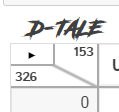

> then click on "Open in New Tab" 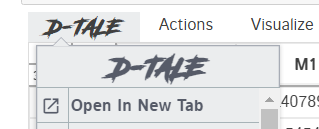

> then click on any operation you want to use in that it will open new tab for the same 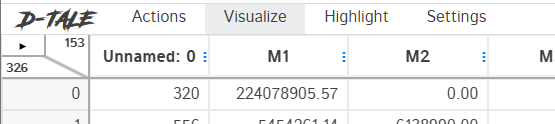

In [9]:
dtale_app.USE_COLAB = True

## Train Dataset

In [332]:
dtale.show(train)

## Test Dataset

In [11]:
dtale.show(test)

## OOT Dataset

In [12]:
dtale.show(OOT_data)

# Mannual EDA

## Inspecting Dataframe Structure

### Structure Size

In [13]:
print("\033[1m" + "Train Shape" + "\033[0m" ,': Rows: {} Columns: {}'.format(train.shape[0], train.shape[1]))
print("\n")
print("\033[1m" + "Test Shape" + "\033[0m" ,': Rows: {} Columns: {}'.format(test.shape[0], test.shape[1]))
print("\n")
print("\033[1m" + "OOT_Data Shape" + "\033[0m" ,': Rows: {} Columns: {}'.format(OOT_data.shape[0], OOT_data.shape[1]))

Train Shape : Rows: 326 Columns: 153


Test Shape : Rows: 88 Columns: 153


OOT_Data Shape : Rows: 88 Columns: 152


In [14]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 326 entries, 0 to 325
Columns: 153 entries, Unnamed: 0 to target
dtypes: float64(142), int64(11)
memory usage: 389.8 KB


In [15]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 88 entries, 0 to 87
Columns: 153 entries, Unnamed: 0 to target
dtypes: float64(142), int64(11)
memory usage: 105.3 KB


In [16]:
OOT_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 88 entries, 0 to 87
Columns: 152 entries, Unnamed: 0 to M151
dtypes: float64(142), int64(10)
memory usage: 104.6 KB


Insight: From the above numbers we can see 1 extra column present in training data and Test Data compared to OOT data(unseen Data) which is Target Variable

### Datatypes 

In [17]:
print("\033[1m" + "Train Datatype" + "\033[0m")
train.dtypes

Train Datatype


Unnamed: 0      int64
M1            float64
M2            float64
M3            float64
M4            float64
               ...   
M148          float64
M149          float64
M150          float64
M151          float64
target          int64
Length: 153, dtype: object

In [18]:
# Value counts of train datatypes
pd.value_counts(train.dtypes)

float64    142
int64       11
dtype: int64

In [19]:
print("\033[1m" + "Test Datatype" + "\033[0m")
test.dtypes

Test Datatype


Unnamed: 0      int64
M1            float64
M2            float64
M3            float64
M4            float64
               ...   
M148          float64
M149          float64
M150          float64
M151          float64
target          int64
Length: 153, dtype: object

In [20]:
# Value counts of test datatypes
pd.value_counts(test.dtypes)

float64    142
int64       11
dtype: int64

In [21]:
print("\033[1m" + "OOT Datatype" + "\033[0m")
OOT_data.dtypes

OOT Datatype


Unnamed: 0      int64
M1            float64
M2            float64
M3            float64
M4            float64
               ...   
M147          float64
M148          float64
M149          float64
M150          float64
M151          float64
Length: 152, dtype: object

In [22]:
# Value counts of OOT datatypes
pd.value_counts(OOT_data.dtypes)

float64    142
int64       10
dtype: int64

In [23]:
train_cat = [var for var in train.columns if train[var].dtype == 'O']
print('There are {} categorical variables in Data \n'.format(len(train_cat)))
print('Categorical Variables are :', train_cat)

There are 0 categorical variables in Data 

Categorical Variables are : []


In [24]:
train_num = [num for num in train.columns if train[num].dtype != 'O']
print('There are {} numerical variable in Data \n'.format(len(train_num)))
print("Numerical Variables are", train_num)

There are 153 numerical variable in Data 

Numerical Variables are ['Unnamed: 0', 'M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9', 'M10', 'M11', 'M12', 'M13', 'M14', 'M15', 'M16', 'M17', 'M18', 'M19', 'M20', 'M21', 'M22', 'M23', 'M24', 'M25', 'M26', 'M27', 'M28', 'M29', 'M30', 'M31', 'M32', 'M33', 'M34', 'M35', 'M36', 'M37', 'M38', 'M39', 'M40', 'M41', 'M42', 'M43', 'M44', 'M45', 'M46', 'M47', 'M48', 'M49', 'M50', 'M51', 'M52', 'M53', 'M54', 'M55', 'M56', 'M57', 'M58', 'M59', 'M60', 'M61', 'M62', 'M63', 'M64', 'M65', 'M66', 'M67', 'M68', 'M69', 'M70', 'M71', 'M72', 'M73', 'M74', 'M75', 'M76', 'M77', 'M78', 'M79', 'M80', 'M81', 'M82', 'M83', 'M84', 'M85', 'M86', 'M87', 'M88', 'M89', 'M90', 'M91', 'M92', 'M93', 'M94', 'M95', 'M96', 'M97', 'M98', 'M99', 'M100', 'M101', 'M102', 'M103', 'M104', 'M105', 'M106', 'M107', 'M108', 'M109', 'M110', 'M111', 'M112', 'M113', 'M114', 'M115', 'M116', 'M117', 'M118', 'M119', 'M120', 'M121', 'M122', 'M123', 'M124', 'M125', 'M126', 'M127', 'M128', 'M

Insight: Same datatypes available in Training, Test as well as OOT dataset and there is no categorical variable

## Dataframe Content Inspection

### Checking Duplicate Value

In [25]:
train.duplicated().sum()
# there is no duplicate in train data

0

In [26]:
test.duplicated().sum()
# there is no duplicate in test data

0

In [27]:
OOT_data.duplicated().sum()
# there is no duplicate in OOT data

0

Insight: There is no Duplicate rows in Train, Test and OOT Dataset

### Checking Null Values

In [28]:
# checking for null values in Train Dataset
print("\033[1m" + "Train Null Values" + "\033[0m")
train.isna().any().sum()

Train Null Values


96

In [29]:
# checking for null values in Test Dataset
print("\033[1m" + "Test Null Values" + "\033[0m")
test.isna().any().sum()

Test Null Values


96

In [30]:
# checking for null values in Test Dataset
print("\033[1m" + "OOT Data Null Values" + "\033[0m")
OOT_data.isna().any().sum()

OOT Data Null Values


92

Insight: From the above Numbers we can see that there is null values present in Train, Test Dataset as well as OOT Dataset

### Unique Values Check

In [31]:
# Train Dataset
train.nunique()

Unnamed: 0    326
M1            316
M2            157
M3             81
M4             83
             ... 
M148          307
M149          180
M150          156
M151          296
target          2
Length: 153, dtype: int64

In [32]:
# Test Dataset
test.nunique()

Unnamed: 0    88
M1            87
M2            40
M3            20
M4            48
              ..
M148          83
M149          51
M150          44
M151          82
target         2
Length: 153, dtype: int64

In [33]:
# OOT Dataset
OOT_data.nunique()

Unnamed: 0    88
M1            88
M2            46
M3            24
M4            48
              ..
M147          15
M148          84
M149          44
M150          44
M151          83
Length: 152, dtype: int64

In [34]:
# Plot for Unique value in each column and compare it between Test,Train and OOT Dataset
fig = make_subplots(rows=1, cols=3,
                    subplot_titles=("Unique values For OOT Dataset", "For Training Dataset","For Test Dataset"))

temp_data=OOT_data.nunique().sort_values()

fig.add_trace(
    go.Bar(x=temp_data.index, y=temp_data.values,marker=dict(color='#0077b6')),
    row=1, col=1
)

temp_data=train.nunique().sort_values()

fig.add_trace(
    go.Bar(x=temp_data.index, y=temp_data.values,marker=dict(color='#DEB078')),
    row=1, col=2
)

temp_data=test.nunique().sort_values()

fig.add_trace(
    go.Bar(x=temp_data.index, y=temp_data.values,marker=dict(color='#003f88')),
    row=1, col=3
)

fig.update_layout(height=400)
fig.show()

Insight: From the above plot, we see unique values present in original Dataset as well as training dataset is approx similliar in distribution across datasets

### Short Summary of Dataset

In [35]:
print("\033[1m" + "Train Data Numerical Columns" + "\033[0m")
train.describe()

Train Data Numerical Columns


,Unnamed: 0,M1,M2,M3,M4,M5,M6,M7,M8,M9,...,M143,M144,M145,M146,M147,M148,M149,M150,M151,target
count,326.000000,3.260000e+02,3.140000e+02,1.990000e+02,326.000000,84.000000,326.000000,153.000000,3.060000e+02,314.000000,...,314.000000,326.000000,3.260000e+02,311.000000,314.000000,326.000000,253.000000,220.000000,311.000000,326.000000
mean,351.622699,2.183109e+08,1.538970e+08,9.414515e+06,10.973707,1.045428,8.833041,inf,3.081783e+08,2.500000,...,2.914468,4.849693,1.477947e+08,5.240423,7.898089,inf,inf,inf,inf,0.751534
std,146.338644,9.150029e+08,9.397521e+08,8.649674e+07,104.572176,1.106846,60.816650,NaN,1.158380e+09,10.092939,...,10.514630,14.778962,4.360334e+08,12.039323,4.222539,NaN,NaN,NaN,NaN,0.432788
min,82.000000,-1.717451e+08,0.000000e+00,-6.769244e+08,0.000000,0.000000,0.000000,0.000000,-1.337182e+09,0.000000,...,0.000000,0.000000,-3.478686e+08,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,225.250000,5.321037e+06,0.000000e+00,0.000000e+00,0.857143,0.668619,1.000000,0.764496,8.395654e+06,0.000000,...,0.142857,0.285714,4.096666e+06,1.000000,5.000000,0.870394,0.712800,0.251617,0.906856,1.000000
50%,358.000000,3.670314e+07,2.508000e+03,0.000000e+00,2.571429,1.000000,2.785714,1.000000,4.616698e+07,0.000000,...,0.428571,1.000000,2.731416e+07,1.857143,9.000000,1.095865,1.077693,1.002007,0.999821,1.000000
75%,477.500000,1.244338e+08,2.152909e+07,2.280886e+05,4.821429,1.031768,5.250000,2.387105,1.725799e+08,1.000000,...,1.428571,3.107143,1.206394e+08,4.000000,11.000000,1.937191,6.131999,2.643547,1.043671,1.000000
max,597.000000,1.383527e+10,1.339118e+10,8.328056e+08,1878.714286,9.000000,1060.428571,inf,1.219680e+10,112.000000,...,101.142857,141.857143,4.686057e+09,104.857143,16.000000,inf,inf,inf,inf,1.000000


In [36]:
print("\033[1m" + "Test Data Numerical Columns" + "\033[0m")
test.describe()

Test Data Numerical Columns


,Unnamed: 0,M1,M2,M3,M4,M5,M6,M7,M8,M9,...,M143,M144,M145,M146,M147,M148,M149,M150,M151,target
count,88.000000,8.800000e+01,8.600000e+01,5.500000e+01,88.000000,20.000000,88.000000,44.000000,8.300000e+01,86.000000,...,86.000000,88.000000,8.800000e+01,86.000000,86.000000,88.000000,62.000000,61.000000,85.000000,88.000000
mean,311.284091,1.215623e+08,6.286844e+07,1.290324e+07,3.810065,inf,4.279221,inf,3.019079e+08,3.279070,...,2.666113,4.003247,2.341980e+08,5.330233,8.093023,inf,inf,inf,3.660341,0.715909
std,137.753232,2.794952e+08,2.255234e+08,3.816909e+07,4.331432,NaN,6.353933,NaN,8.497621e+08,12.252876,...,10.360619,11.508688,7.689468e+08,11.612406,4.315847,NaN,NaN,NaN,18.341012,0.453565
min,91.000000,-2.547579e+08,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,-2.597201e+08,0.000000,...,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.048041,0.000000
25%,202.250000,4.523800e+06,0.000000e+00,0.000000e+00,0.821429,0.299074,0.821429,0.844941,8.646361e+06,0.000000,...,0.142857,0.250000,4.401680e+06,0.839286,5.000000,0.912642,0.660930,0.459746,0.950990,0.000000
50%,302.000000,1.937438e+07,0.000000e+00,0.000000e+00,2.000000,0.567743,2.285714,1.059132,4.989258e+07,0.000000,...,0.571429,1.000000,2.839264e+07,1.666667,9.500000,1.155029,0.998397,1.001232,1.000079,1.000000
75%,388.500000,8.109976e+07,6.330471e+06,4.354844e+05,5.357143,1.000000,5.142857,NaN,1.762978e+08,1.000000,...,1.142857,3.285714,1.183131e+08,4.741071,11.000000,2.618154,4.440612,3.157989,1.128173,1.000000
max,593.000000,1.309011e+09,1.743598e+09,1.915254e+08,21.000000,inf,46.142857,inf,5.596014e+09,78.000000,...,92.714286,84.857143,5.503210e+09,80.857143,15.000000,inf,inf,inf,155.905512,1.000000


In [37]:
print("\033[1m" + "OOT Data Numerical Columns" + "\033[0m")
OOT_data.describe()

OOT Data Numerical Columns


,Unnamed: 0,M1,M2,M3,M4,M5,M6,M7,M8,M9,...,M142,M143,M144,M145,M146,M147,M148,M149,M150,M151
count,88.000000,8.800000e+01,8.700000e+01,5.300000e+01,88.000000,22.000000,88.000000,39.000000,8.500000e+01,87.000000,...,8.700000e+01,87.000000,88.000000,8.800000e+01,88.000000,87.000000,88.000000,68.000000,57.000000,86.000000
mean,367.113636,1.620105e+08,1.824532e+08,1.671566e+07,3.558442,inf,3.629870,inf,1.523726e+08,1.586207,...,1.435494e+08,1.970443,3.412338,1.435660e+08,4.054410,8.321839,inf,inf,inf,inf
std,145.322585,4.684330e+08,1.274286e+09,5.093470e+07,3.280580,NaN,3.307782,NaN,4.764209e+08,7.210380,...,3.498424e+08,6.335507,8.407810,3.844532e+08,7.822394,4.213749,NaN,NaN,NaN,NaN
min,47.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,1.008065e+05,0.000000,...,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,235.750000,8.797617e+06,0.000000e+00,0.000000e+00,1.000000,1.000000,1.142857,0.650592,4.041996e+06,0.000000,...,3.419429e+05,0.142857,0.571429,2.639722e+06,1.160714,5.500000,0.881363,0.577833,0.624637,0.905707
50%,387.500000,2.576382e+07,1.006140e+05,0.000000e+00,2.428571,1.000000,2.857143,0.987535,2.081377e+07,0.000000,...,5.748310e+06,0.714286,1.357143,2.803026e+07,2.000000,10.000000,1.048443,1.027172,1.012010,1.000223
75%,485.750000,9.046637e+07,9.830108e+06,3.592687e+06,5.178571,1.765636,4.285714,1.316341,1.003614e+08,1.000000,...,7.531396e+07,1.571429,2.607143,1.005438e+08,3.187500,12.000000,1.251024,inf,1.585083,1.157316
max,598.000000,2.894089e+09,1.175851e+10,2.416057e+08,15.142857,inf,15.857143,inf,3.062440e+09,66.000000,...,1.889770e+09,57.000000,57.142857,3.111096e+09,60.714286,14.000000,inf,inf,inf,inf


## Checking for duplicate columns

### Train

In [38]:
col_list_train = train.columns.tolist()
len(col_list_train)

153

In [39]:
# create an empty list to store the pairs of columns with the same values
same_value_cols = []
    
def uniquepaircols(df):
    # loop through all pairs of columns
    for i in range(df.shape[1]):
        for j in range(i + 1, df.shape[1]):
            if df.iloc[:, i].equals(df.iloc[:, j]):
                same_value_cols.append((i, j))

In [40]:
# create an empty list to store the pairs of columns with the same values
same_value_cols = []

In [41]:
# calling the function
uniquepaircols(train)

# print the pairs of columns with the same values
print(same_value_cols)

[]


Insights: There is no duplicate columns which all have same values in Train dataset

### Test

In [42]:
# create an empty list to store the pairs of columns with the same values
same_value_cols = []

In [43]:
# calling the function
uniquepaircols(test)

# print the pairs of columns with the same values
print(same_value_cols)

[]


Insights: There is no duplicate columns which all have same values in test dataset

### OOT Dataset

In [44]:
# create an empty list to store the pairs of columns with the same values
same_value_cols = []

In [45]:
# calling the function
uniquepaircols(OOT_data)

# print the pairs of columns with the same values
print(same_value_cols)

[]


Insights: There is no duplicate columns which all have same values in OOT dataset





## Checking for Data Leakage

In [46]:
# Combine both test data frames into a single data frame
temp_df = pd.concat([train,test])

In [47]:
temp_df.head()

,Unnamed: 0,M1,M2,M3,M4,M5,M6,M7,M8,M9,...,M143,M144,M145,M146,M147,M148,M149,M150,M151,target
0,320,2.240789e+08,0.0,0.0,8.142857,1.5,2.857143,2.387105,5.720456e+07,0.0,...,0.142857,1.428571,5.943793e+06,3.714286,8.0,1.137554,NaN,8.426000,0.914831,0
1,556,5.454261e+06,6138990.0,0.0,5.142857,NaN,0.285714,1.029878,1.694720e+08,0.0,...,0.285714,1.285714,4.264630e+06,2.600000,10.0,0.940661,2.000506,inf,1.016467,1
2,421,2.359738e+07,1272552.0,0.0,3.428571,NaN,4.000000,1.103578,1.852271e+07,16.0,...,6.714286,9.142857,1.321201e+07,6.500000,13.0,1.007713,0.502552,1.157555,0.988912,0
3,184,2.243215e+08,0.0,0.0,3.285714,NaN,10.714286,NaN,1.050155e+06,0.0,...,0.000000,6.000000,7.029361e+08,11.500000,0.0,1.504471,2.827495,0.670929,0.483688,0
4,496,6.892245e+07,0.0,0.0,3.285714,1.0,1.857143,0.000000,NaN,0.0,...,0.000000,0.142857,1.230383e+06,0.833333,2.0,inf,inf,NaN,0.600029,1


In [48]:
temp_df.shape

(414, 153)

In [49]:
# dropping the target variable
temp_df.drop("target",axis =1, inplace = True)

In [50]:
for i in temp_df.itertuples():
    for j in OOT_data.itertuples():
        if i == j:
            print('Found matching row:', i)
            break

Insights: There is no Data Leakage Problem

## Detailed Analysis

I have divided this Detailed Analysis into two sets :
1. Target
2. Numerical Cols

In [51]:
def plot_kde(data, cols):
    num_cols = len(cols)
    num_rows = (num_cols + 2 - 1) // 2 
    fig, axes = plt.subplots(nrows=num_rows, ncols=2, figsize=(15, 5*num_rows))
    axes = axes.flatten()
    
    for i, col in enumerate(cols):
        sns.kdeplot(data=data[data['target']==0][col], ax=axes[i], label='target 0', shade=True)
        sns.kdeplot(data=data[data['target']==1][col], ax=axes[i], label='target 1', shade=True)
        axes[i].set_xlabel(col)
        axes[i].set_title(f"Distribution of {col}")
        axes[i].legend()
    plt.tight_layout()
    plt.show()

In [52]:
# Histplot function
def plot_histplot(data,col):
  plt.figure(figsize=(10,5))
  sns.histplot(x=data[col],color='green',label=col, kde=True)
  plt.title('Distribution of '+col)
  plt.show()

In [53]:
def plot_boxplot(df, num_cols, target_col):
    plt.figure(figsize=(12, 8))
    # Loop through numerical columns
    for col in num_cols:
        # Create boxplot for each column
        sns.boxplot(x=target_col, y=col, data=df,color = "green")
        plt.title(f"{col} Boxplot")
        plt.show()

In [54]:
# Count plot function
def plot_count(data,col):
  plt.figure(figsize=(15,4))
  ax=sns.countplot(x=col,data=data, palette = "hls")
  plt.show()

In [55]:
# Count values of categorical columns in Data
def count_unique(df, col):
    print('\n' + "\033[1m"+ 'For column ' +col+"\033[0m")
    print(round((df[col].value_counts()/df.shape[0])*100,2))

In [56]:
# Count plot function with target variable
def plot_count_target(data,targetcol,col):
  plt.figure(figsize=(12,6))
  sns.countplot(data=data,x= col,hue=targetcol)
  plt.xticks(rotation='vertical')
  plt.show()

In [57]:
def count_table_with_target(col,data):
  count_job_response = pd.crosstab(data['target'], data[col]).apply(lambda x: x/x.sum() * 100)
  count_job_response = count_job_response.transpose()
  print("\033[1m" + col.upper() + "\033[0m")
  print(count_job_response)
  print("\n")

### Target Variable

In [58]:
# Target variable datatype in train
train.target.dtypes

dtype('int64')

In [59]:
# Target variable datatype in test
test.target.dtypes

dtype('int64')

In [60]:
print("Null Value in target in Train Data :", train.target.isnull().sum())
print("Number of Unique Values in target in Train Data :", train.target.nunique())

Null Value in target in Train Data : 0
Number of Unique Values in target in Train Data : 2


In [61]:
print("Null Value in target in Test Data:", test.target.isnull().sum())
print("Number of Unique Values in target in Test Data:", test.target.nunique())

Null Value in target in Test Data: 0
Number of Unique Values in target in Test Data: 2


In [62]:
print("Number of 1(yes) and 0(no) in Target in Train Data are :\n", train.target.value_counts())

Number of 1(yes) and 0(no) in Target in Train Data are :
 1    245
0     81
Name: target, dtype: int64


In [63]:
print("Number of 1(yes) and 0(no) in Target in Test Data are :\n", test.target.value_counts())

Number of 1(yes) and 0(no) in Target in Test Data are :
 1    63
0    25
Name: target, dtype: int64


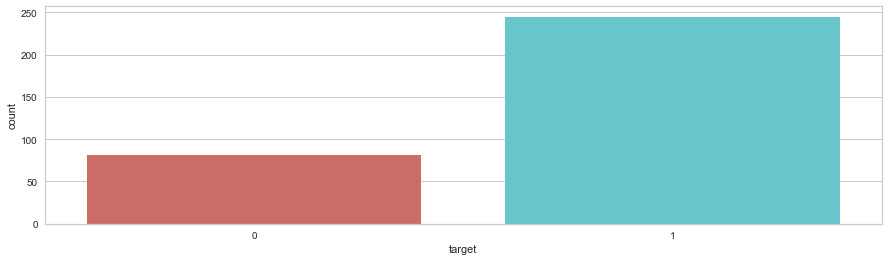

In [64]:
# count plot of target variable in Train
plot_count(train,"target")

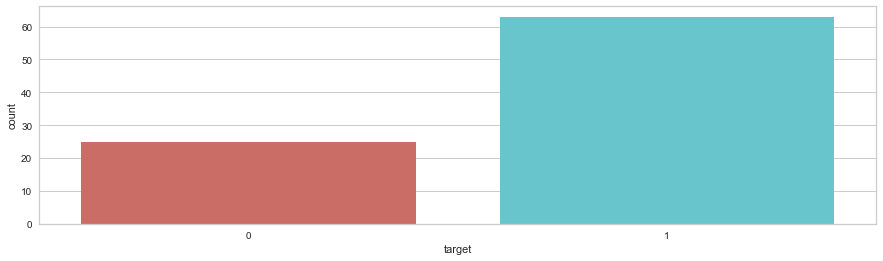

In [65]:
# count plot of target variable in Test
plot_count(test,"target")

In [66]:
# Percentage of 1(yes) and 0(no) class in target variable in % in Train Data
count_unique(train, "target")


For column target
1    75.15
0    24.85
Name: target, dtype: float64


In [67]:
# Percentage of 1(yes) and 0(no) class in target variable in % in Test Data
count_unique(test, "target")


For column target
1    71.59
0    28.41
Name: target, dtype: float64


In [68]:
# Short summary of target variable in Train Data
train.target.describe()

count    326.000000
mean       0.751534
std        0.432788
min        0.000000
25%        1.000000
50%        1.000000
75%        1.000000
max        1.000000
Name: target, dtype: float64

In [69]:
# Short summary of target variable in Test Data
test.target.describe()

count    88.000000
mean      0.715909
std       0.453565
min       0.000000
25%       0.000000
50%       1.000000
75%       1.000000
max       1.000000
Name: target, dtype: float64

Insights: There is imbalanced dataset situation

### Numerical Columns 

#### Train Data

##### Null value Analysis

In [70]:
# get the columns with null values in train
null_cols_train = train.isnull().any(axis=0)
null_cols_train = null_cols_train[null_cols_train].index.tolist()

In [71]:
# number of missing value cols
len(null_cols_train)

96

In [72]:
# Null value percentage
def nullcol(data,col):
    count_NullValues = len(data[data[col].isnull()])

    print("Missing values percentage " + col + " : {:.2f}%".format((count_NullValues / (len(data[col])))*100))
    print("\n")

In [73]:
# calling the null value percentage function in train dataset
for i in null_cols_train:
    nullcol(train,i)

Missing values percentage M2 : 3.68%


Missing values percentage M3 : 38.96%


Missing values percentage M5 : 74.23%


Missing values percentage M7 : 53.07%


Missing values percentage M8 : 6.13%


Missing values percentage M9 : 3.68%


Missing values percentage M10 : 5.83%


Missing values percentage M12 : 13.80%


Missing values percentage M14 : 5.21%


Missing values percentage M16 : 3.68%


Missing values percentage M17 : 0.61%


Missing values percentage M20 : 3.68%


Missing values percentage M21 : 3.68%


Missing values percentage M22 : 3.68%


Missing values percentage M25 : 52.45%


Missing values percentage M29 : 3.68%


Missing values percentage M30 : 58.28%


Missing values percentage M31 : 3.99%


Missing values percentage M32 : 9.20%


Missing values percentage M33 : 52.45%


Missing values percentage M34 : 27.30%


Missing values percentage M35 : 6.13%


Missing values percentage M36 : 73.31%


Missing values percentage M37 : 3.68%


Missing values percentage M38 : 3.68%

In [74]:
# Null value percentage with parameters in Train Dataset
null_value_less_than_10 = []
null_value_less_than_50_and_greater_than_10 = []
null_value_greater_than_50 = []

def nullcol_perameter(data,col):
    count_NullValues = len(data[data[col].isnull()])
    if ((count_NullValues / (len(data[col])))*100) < 10.0:
        null_value_less_than_10.append(i)
    elif (((count_NullValues / (len(data[col])))*100) >= 10.0) and (((count_NullValues / (len(data[col])))*100) < 50.0):
        null_value_less_than_50_and_greater_than_10.append(i)
    else:
        null_value_greater_than_50.append(i)

In [75]:
# calling the null value percentage perameter function in Test dataset
for i in null_cols_train:
    nullcol_perameter(train,i)

In [76]:
print("\033[1m" + "null value less than 10% in Train" + "\033[0m")
print(null_value_less_than_10)
print("length", len(null_value_less_than_10))
print("\n")
print("\033[1m" + "null value less than 50 and greater than 10% in Train" + "\033[0m")
print(null_value_less_than_50_and_greater_than_10)
print("length", len(null_value_less_than_50_and_greater_than_10)) 
print("\n")
print("\033[1m" + "null value greater than 50% in Train" + "\033[0m")
print(null_value_greater_than_50)
print("length", len(null_value_greater_than_50))

null value less than 10% in Train
['M2', 'M8', 'M9', 'M10', 'M14', 'M16', 'M17', 'M20', 'M21', 'M22', 'M29', 'M31', 'M32', 'M35', 'M37', 'M38', 'M42', 'M43', 'M44', 'M48', 'M50', 'M51', 'M55', 'M56', 'M62', 'M65', 'M67', 'M73', 'M74', 'M78', 'M79', 'M80', 'M82', 'M83', 'M84', 'M87', 'M90', 'M91', 'M92', 'M94', 'M100', 'M101', 'M105', 'M106', 'M109', 'M111', 'M112', 'M116', 'M117', 'M124', 'M125', 'M126', 'M129', 'M130', 'M132', 'M133', 'M134', 'M142', 'M143', 'M146', 'M147', 'M151']
length 62


null value less than 50 and greater than 10% in Train
['M3', 'M12', 'M34', 'M41', 'M52', 'M53', 'M63', 'M71', 'M81', 'M86', 'M95', 'M96', 'M97', 'M102', 'M103', 'M107', 'M108', 'M113', 'M135', 'M137', 'M149', 'M150']
length 22


null value greater than 50% in Train
['M5', 'M7', 'M25', 'M30', 'M33', 'M36', 'M39', 'M40', 'M46', 'M49', 'M64', 'M72']
length 12


In [77]:
null_value_less_than_10_train = null_value_less_than_10
null_value_less_than_50_and_greater_than_10_train = null_value_less_than_50_and_greater_than_10
null_value_greater_than_50_train = null_value_greater_than_50 

<AxesSubplot: >

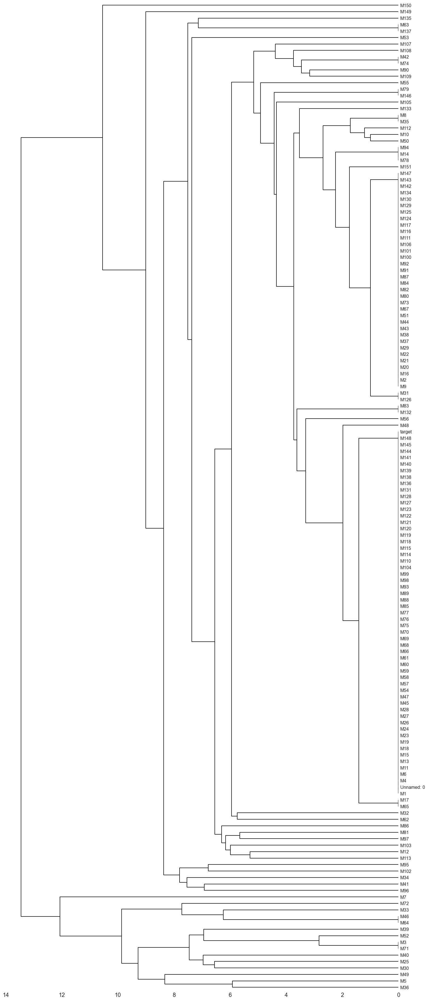

In [79]:
import missingno as msno

msno.dendrogram(train)

Insights: 


Above Diagram is Dendogram


> Dendrogram: The dendrogram like heatmap groups columns based on nullity relation between them. It groups columns together where there is more nullity relation. It works almost like hierarchical clustering but uses nullity correlation for clustering which keeps columns with the same missing values distribution in one cluster.

> As we can see that there is {M3, M71}, {M46, M64}, {M17,M65}, {M63, M137}, {M42, M74}, {M79, M146}, {M8, M35}, {M94, M14, M78}, {M83, M132}, {M31, M126} have a nullity correlation of 1.0

> there are 62 features that have null values less than 10%

> there are 22 features that have null values less than 50% and more than 10%

> there are 12 features that have null values more than 50%

##### Unique Values Analysis

In [80]:
# checking the unique values in dataset
def uniquevalue(data, col):
    print("Number of Unique Values in "+ col+" :", data[col].nunique())

In [81]:
# calling the function 
for i in train.columns.tolist()[1:-1]:
    uniquevalue(train,i)

Number of Unique Values in M1 : 316
Number of Unique Values in M2 : 157
Number of Unique Values in M3 : 81
Number of Unique Values in M4 : 83
Number of Unique Values in M5 : 48
Number of Unique Values in M6 : 90
Number of Unique Values in M7 : 103
Number of Unique Values in M8 : 306
Number of Unique Values in M9 : 25
Number of Unique Values in M10 : 307
Number of Unique Values in M11 : 240
Number of Unique Values in M12 : 244
Number of Unique Values in M13 : 83
Number of Unique Values in M14 : 52
Number of Unique Values in M15 : 23
Number of Unique Values in M16 : 62
Number of Unique Values in M17 : 52
Number of Unique Values in M18 : 90
Number of Unique Values in M19 : 93
Number of Unique Values in M20 : 241
Number of Unique Values in M21 : 24
Number of Unique Values in M22 : 59
Number of Unique Values in M23 : 314
Number of Unique Values in M24 : 162
Number of Unique Values in M25 : 91
Number of Unique Values in M26 : 31
Number of Unique Values in M27 : 29
Number of Unique Values in 

In [82]:
# checking if there is column which has less than 25 unique values
# I am assuming that maybe it is encoded so we will check it in deep analysis
unique_value_list = []
for i in train.columns.tolist()[1:-1]:
    if (train[i].nunique()<20):
        unique_value_list.append(i)

print(unique_value_list)
print("\n")
print("count of unique value list", len(unique_value_list))

['M43', 'M44', 'M52', 'M58', 'M69', 'M92', 'M147']


count of unique value list 7


In [83]:
list1 = unique_value_list

In [84]:
# checking their min , max , median means short summary for that variables
for i in unique_value_list:
    print("\033[1m" + i + "\033[0m")
    print(train[i].describe())
    print("\n")

M43
count    314.000000
mean       9.308917
std        3.526728
min        0.000000
25%        8.000000
50%       10.000000
75%       12.000000
max       15.000000
Name: M43, dtype: float64


M44
count    314.000000
mean       6.394904
std        2.946288
min        0.000000
25%        5.000000
50%        6.500000
75%        8.750000
max       14.000000
Name: M44, dtype: float64


M52
count    191.000000
mean       3.623037
std        4.072280
min        0.000000
25%        0.000000
50%        2.000000
75%        6.500000
max       14.000000
Name: M52, dtype: float64


M58
count    326.000000
mean       1.868098
std        3.498276
min        0.000000
25%        0.000000
50%        1.000000
75%        2.000000
max       18.000000
Name: M58, dtype: float64


M69
count    326.000000
mean       2.874233
std        3.806005
min        0.000000
25%        0.000000
50%        2.000000
75%        4.000000
max       19.000000
Name: M69, dtype: float64


M92
count    314.000000
mean       7.757

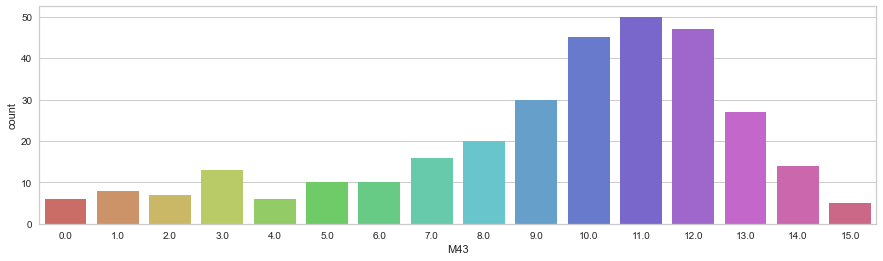

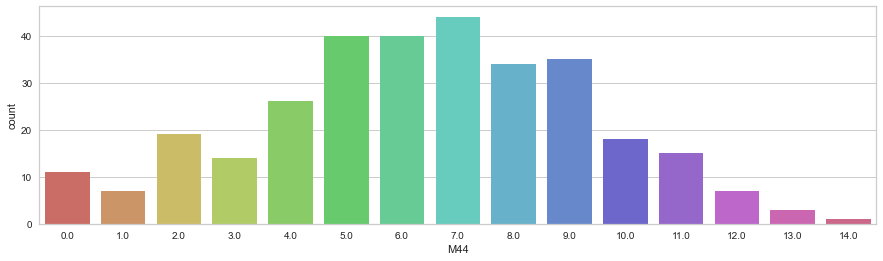

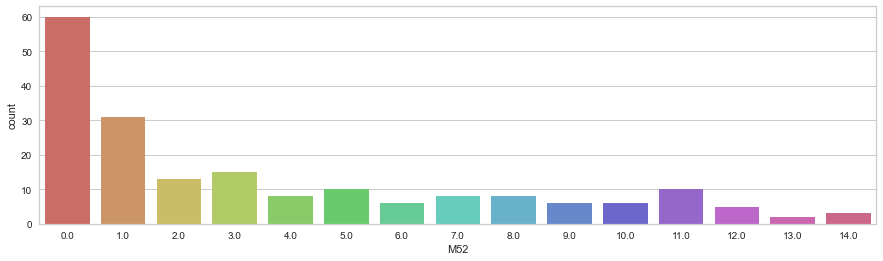

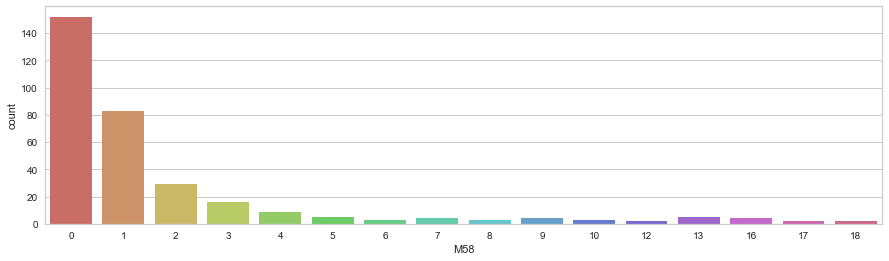

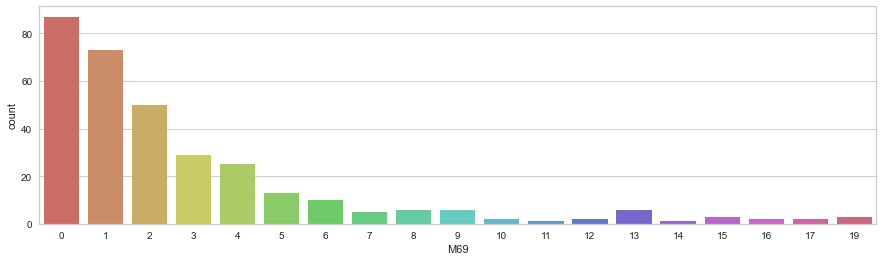

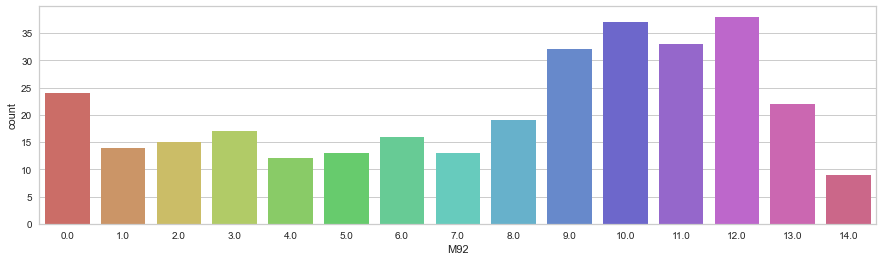

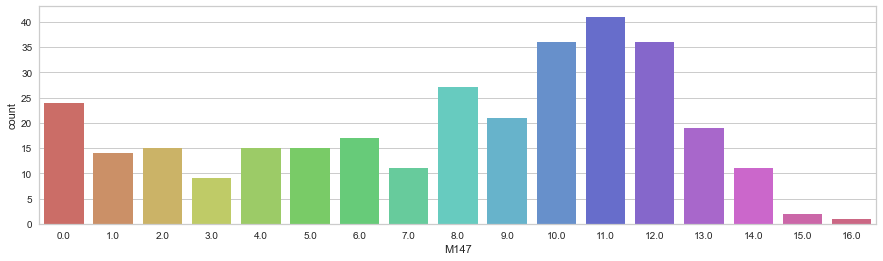

In [85]:
# checking their count plot so see each class value
for i in unique_value_list:
    plot_count(train,i)

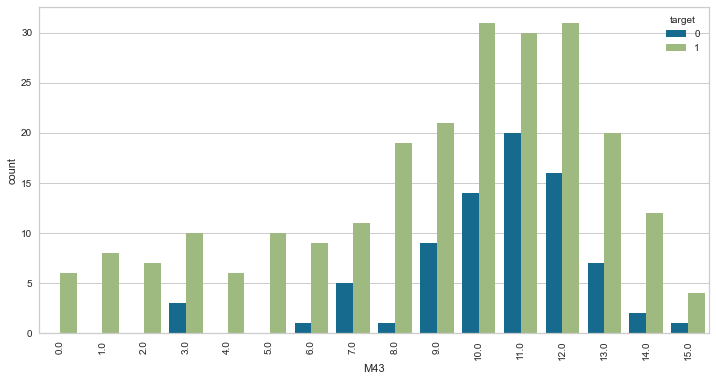

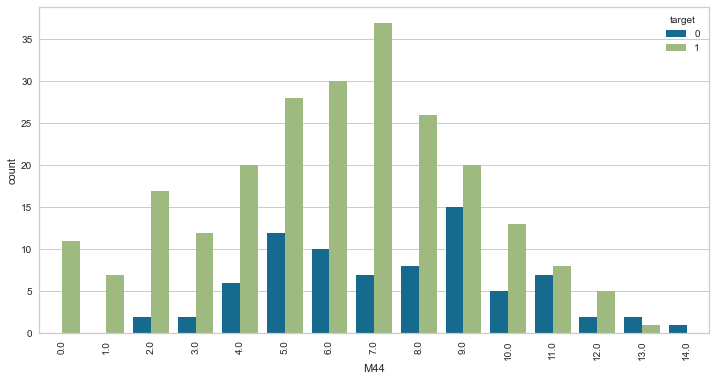

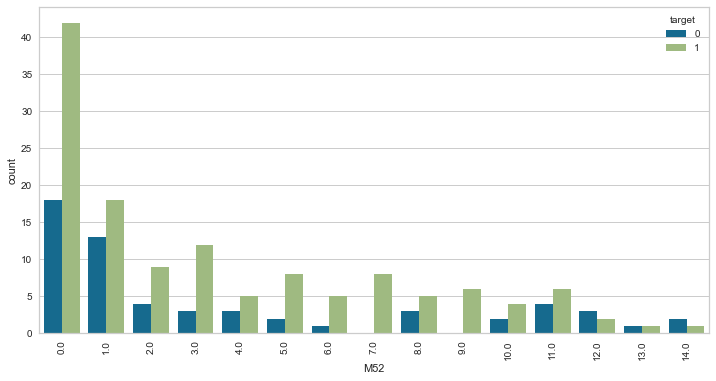

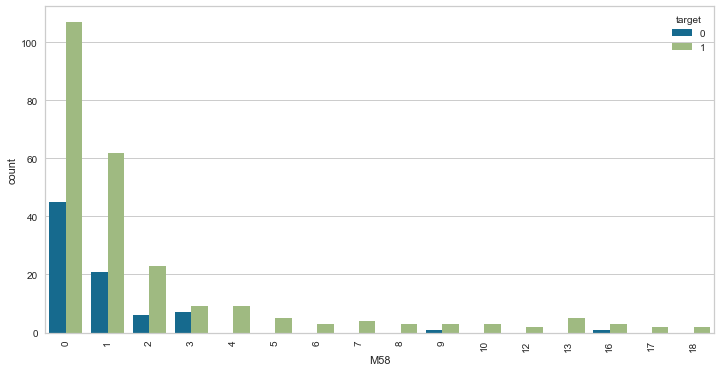

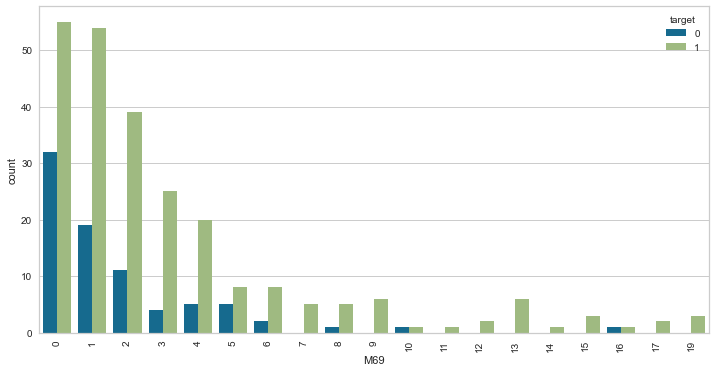

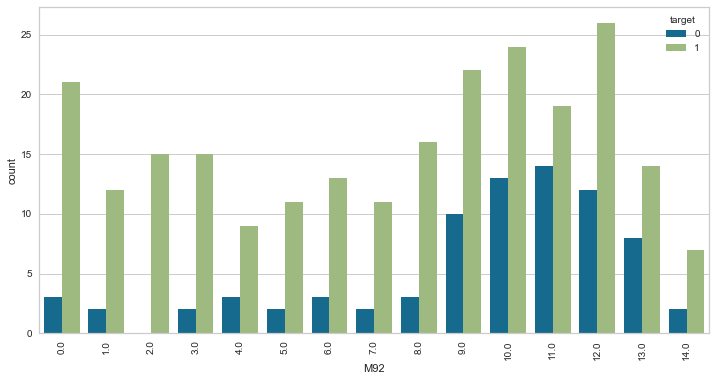

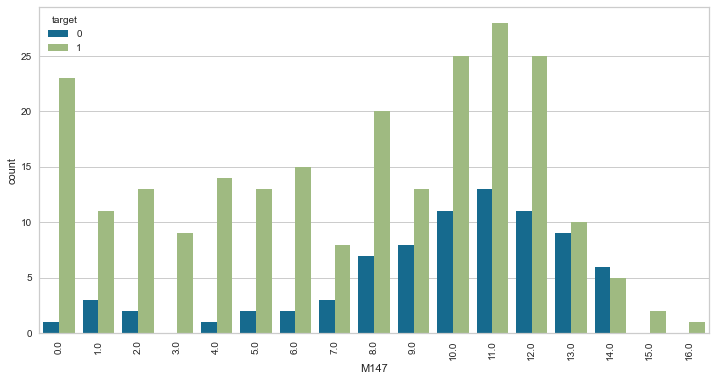

In [86]:
# checking their count plot with respect to target variable so that i can tell each class impact on target
for i in unique_value_list:
    plot_count_target(train,"target",i)

In [87]:
# checking their value counts
for i in unique_value_list:
    count_unique(train,i)


For column M43
11.0    15.34
12.0    14.42
10.0    13.80
9.0      9.20
13.0     8.28
8.0      6.13
7.0      4.91
14.0     4.29
3.0      3.99
6.0      3.07
5.0      3.07
1.0      2.45
2.0      2.15
0.0      1.84
4.0      1.84
15.0     1.53
Name: M43, dtype: float64

For column M44
7.0     13.50
6.0     12.27
5.0     12.27
9.0     10.74
8.0     10.43
4.0      7.98
2.0      5.83
10.0     5.52
11.0     4.60
3.0      4.29
0.0      3.37
1.0      2.15
12.0     2.15
13.0     0.92
14.0     0.31
Name: M44, dtype: float64

For column M52
0.0     18.40
1.0      9.51
3.0      4.60
2.0      3.99
5.0      3.07
11.0     3.07
4.0      2.45
8.0      2.45
7.0      2.45
6.0      1.84
10.0     1.84
9.0      1.84
12.0     1.53
14.0     0.92
13.0     0.61
Name: M52, dtype: float64

For column M58
0     46.63
1     25.46
2      8.90
3      4.91
4      2.76
13     1.53
5      1.53
9      1.23
16     1.23
7      1.23
10     0.92
8      0.92
6      0.92
12     0.61
17     0.61
18     0.61
Name: M58, dtype: floa

In [88]:
# checking their impact on target variable of each class in that variables
for i in unique_value_list:
    count_table_with_target(i, train)

M43
target          0           1
M43                          
0.0      0.000000  100.000000
1.0      0.000000  100.000000
2.0      0.000000  100.000000
3.0     23.076923   76.923077
4.0      0.000000  100.000000
5.0      0.000000  100.000000
6.0     10.000000   90.000000
7.0     31.250000   68.750000
8.0      5.000000   95.000000
9.0     30.000000   70.000000
10.0    31.111111   68.888889
11.0    40.000000   60.000000
12.0    34.042553   65.957447
13.0    25.925926   74.074074
14.0    14.285714   85.714286
15.0    20.000000   80.000000


M44
target           0           1
M44                           
0.0       0.000000  100.000000
1.0       0.000000  100.000000
2.0      10.526316   89.473684
3.0      14.285714   85.714286
4.0      23.076923   76.923077
5.0      30.000000   70.000000
6.0      25.000000   75.000000
7.0      15.909091   84.090909
8.0      23.529412   76.470588
9.0      42.857143   57.142857
10.0     27.777778   72.222222
11.0     46.666667   53.333333
12.0     28.5714

Insights: 

1. There are 7 columns which has unique value less than 20 class.
2. Also, we found that there are some class in that 7 columns that have only impact on 1(yes) and 0(no).

#####  Infinity Value Analysis

In [89]:
# Check which columns contain infinity values
cols_with_inf = train.columns[np.isinf(train).any()].tolist()

# Print the columns containing infinity values
print("Columns with infinity values:", cols_with_inf)

Columns with infinity values: ['M7', 'M34', 'M36', 'M53', 'M95', 'M148', 'M149', 'M150', 'M151']


In [90]:
# number of cols that has inf values
len(cols_with_inf)

9

Insights:

1. 9 columns have infinity values

#####  Outlier Analysis

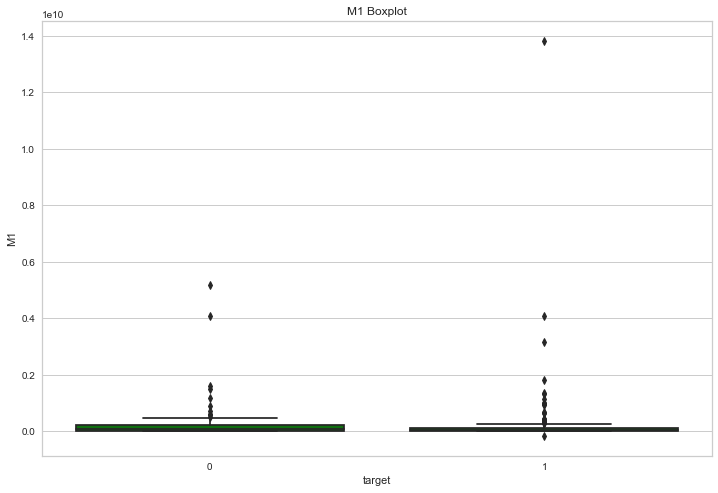

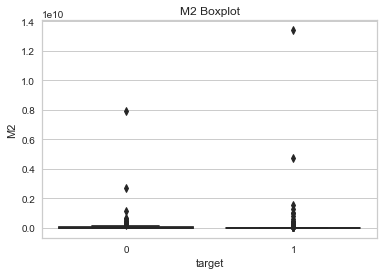

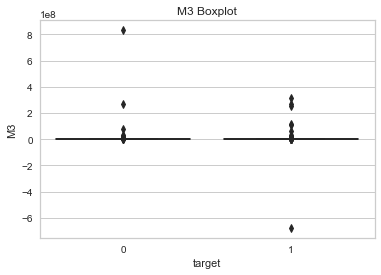

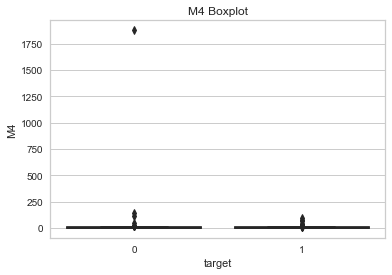

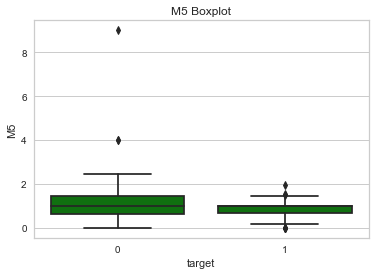

...

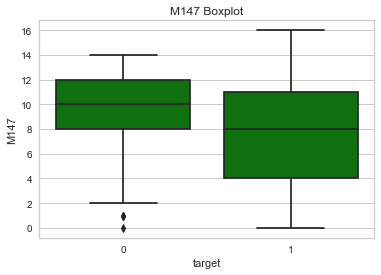

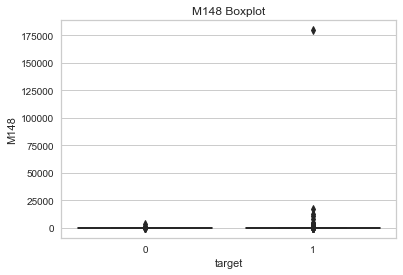

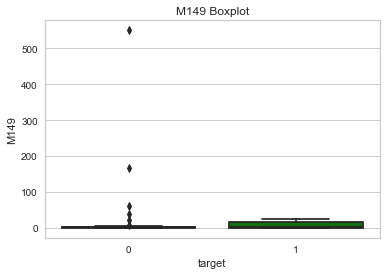

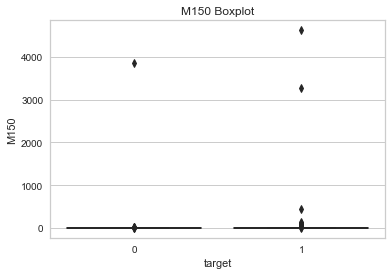

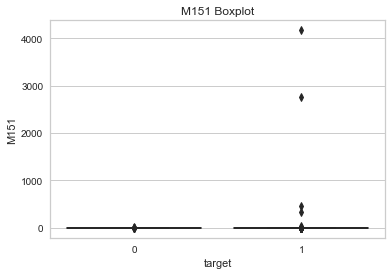

In [91]:
# visualing the cols so we understand the outliers in cols
plot_boxplot(train,train.columns.tolist()[1:-1],"target")

In [92]:
outliers_cols = []

In [93]:
import numpy as np

def outliers_list_col(data, num_cols, threshold=1.5):
#     outliers_cols = []
    for col in num_cols:
        # Calculate the first and third quartiles and interquartile range (IQR)
        q1 = np.percentile(data[col], 25)
        q3 = np.percentile(data[col], 75)
        iqr = q3 - q1

        # Define the outlier threshold as threshold times the IQR below the first quartile or above the third quartile
        lower_threshold = q1 - threshold * iqr
        upper_threshold = q3 + threshold * iqr

        # Identify the outliers in the column
        outliers = data[(data[col] < lower_threshold) | (data[col] > upper_threshold)]

        # Check if the column contains outliers and append the column name to the list if it does
        if not outliers.empty:
            outliers_cols.append(col)

    return outliers_cols

In [94]:
# calling the function
outliers_list_col(train,train.columns.tolist()[1:-1])

['M1',
 'M4',
 'M6',
 'M11',
 'M13',
 'M15',
 'M18',
 'M19',
 'M23',
 'M24',
 'M26',
 'M27',
 'M28',
 'M45',
 'M47',
 'M54',
 'M57',
 'M58',
 'M59',
 'M60',
 'M61',
 'M66',
 'M68',
 'M69',
 'M70',
 'M75',
 'M76',
 'M77',
 'M85',
 'M89',
 'M93',
 'M98',
 'M99',
 'M104',
 'M110',
 'M114',
 'M115',
 'M118',
 'M119',
 'M120',
 'M121',
 'M122',
 'M123',
 'M127',
 'M128',
 'M131',
 'M136',
 'M138',
 'M139',
 'M140',
 'M141',
 'M144',
 'M145',
 'M148']

In [95]:
# 56 cols have outliers
len(outliers_cols)

54

In [96]:
list3 = outliers_cols

In [97]:
# Convert lists to sets and find the intersection of cols which has outliers and null values also
intersection = set(null_cols_train).intersection(outliers_cols)

# Print that cols
print("Intersection of list1 and list2:", intersection)

Intersection of list1 and list2: set()


Insights:

1. 54 features have outliers 

##### Normal Distribution Analysis

Why normal distribution analysis


> Model performance: Some machine learning algorithms like logistic regression in this case, assume that the target variable is normally distributed. By transforming the numerical variables to have a normal distribution, we can improve the performance of these models.

> Outlier handling: Transforming the data to have a normal distribution can help us better handle outliers. Outliers can have a large impact on the mean and standard deviation, which are used in many machine learning algorithms. By transforming the data, we can reduce the impact of outliers on these statistics.

> Interpretation: Normal distributions are easy to interpret and visualize. By transforming the data to have a normal distribution, we can more easily understand the distribution of our data and identify patterns and relationships.

1.   When the value of the skewness is positive, the tail of the distribution is longer towards the right hand side of the curve.

2.   If skewness is less than -1 or greater than 1, the distribution is highly skewed. If skewness is between -1 and -0.5 or between 0.5 and 1, the distribution is moderately skewed. If skewness is between -0.5 and 0.5, the distribution is approximately symmetric.

3.   Mesokurtosis: A kurtosis of 0. Platykurtosis: A negative excess kurtosis. Platykurtic distributions are thin-tailed, meaning that they have few outliers. Leptokurtosis: A positive excess kurtosis. Leptokurtic distributions are fat-tailed, meaning that they have many outliers.

In [98]:
def checking_normal(data, target_col = "target", thresh=1.96):
    # Split the DataFrame into two based on the target variable
    class_0 = data[data[target_col] == 0]
    class_1 = data[data[target_col] == 1]
    
    # Initialize an empty dictionary to store the results
    results = {}
    
    # Loop over the numerical columns in the DataFrame
    for col in data.columns[1:-1]:
        # Calculate skewness and kurtosis for each class of the target variable
        skew_0 = skew(class_0[col])
        kurtosis_0 = kurtosis(class_0[col])
        
        skew_1 = skew(class_1[col])
        kurtosis_1 = kurtosis(class_1[col])
        
        # Determine whether each column is normally distributed for each class of the target variable
        is_normal_0 = abs(skew_0) < thresh and abs(kurtosis_0 - 3) < thresh
        is_normal_1 = abs(skew_1) < thresh and abs(kurtosis_1 - 3) < thresh
        
        # Store the results in the dictionary
        results[col] = {'class_0': is_normal_0, 'class_1': is_normal_1}
    
    # Convert the dictionary to a DataFrame and return it
    return pd.DataFrame.from_dict(results)

In [99]:
# Identify which columns are not normally distributed for each class of the target variable
non_normal_cols = checking_normal(train).apply(lambda x: ~(x['class_0'] & x['class_1']))
non_normal_cols = non_normal_cols[non_normal_cols].index.tolist()

# Print the length of the non-normal distribution columns
print(len(non_normal_cols))

151


In [100]:
# checking normal distribution with qq plot in yes case
def plot_qqplot_yes(data,col):
    mask = ~np.isnan(data[data["target"] == 1][col])
    data_filtered = data[data["target"]==1][col][mask]
    data_finite = data_filtered[np.isfinite(data_filtered)]
    qqplot(data_finite,norm,fit=True,line="45")
    plt.show()

In [101]:
# checking normal distribution with qq plot in yes case
def plot_qqplot_no(data,col):
    mask = ~np.isnan(data[data["target"] == 0][col])
    data_filtered = data[data["target"]==0][col][mask]
    data_finite = data_filtered[np.isfinite(data_filtered)]
    qqplot(data_finite,norm,fit=True,line="45")
    plt.show()

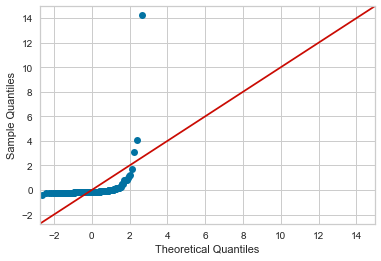

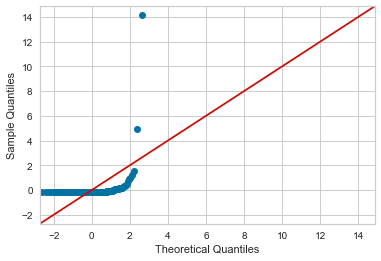

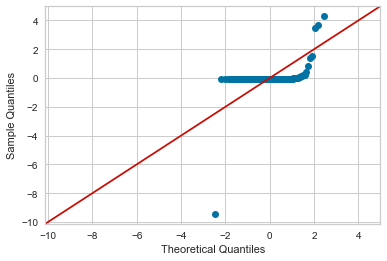

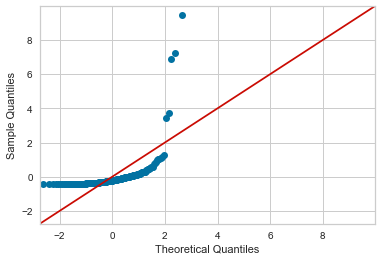

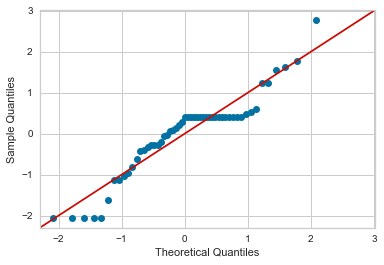

...

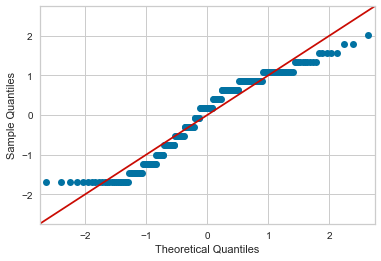

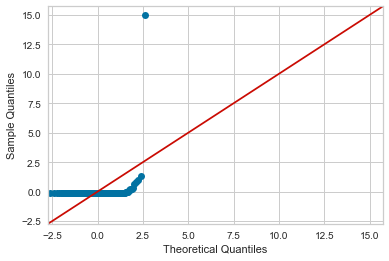

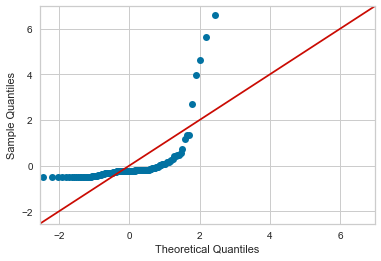

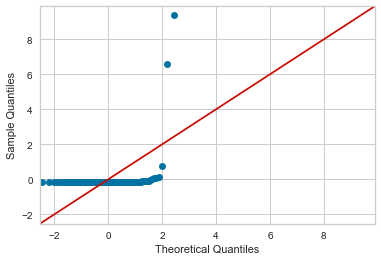

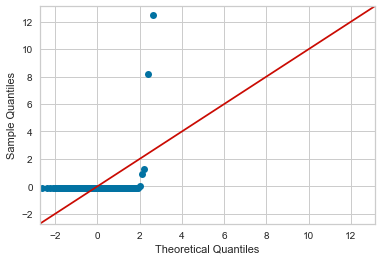

In [102]:
# calling the function
for i in train.columns[1:-1]:
    plot_qqplot_yes(train,i)

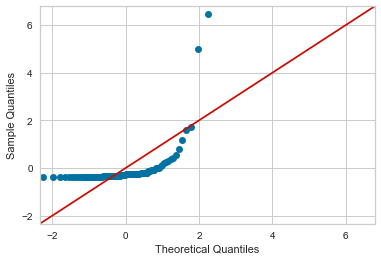

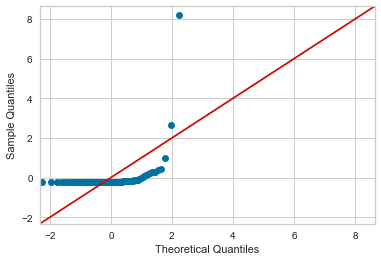

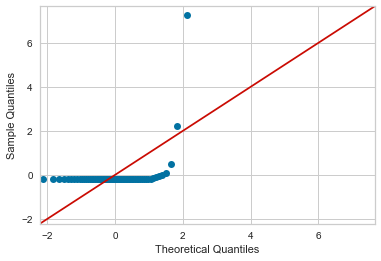

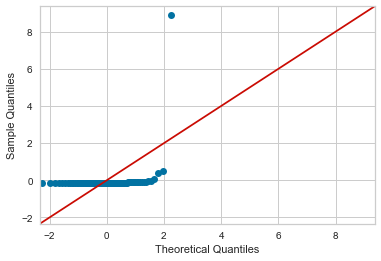

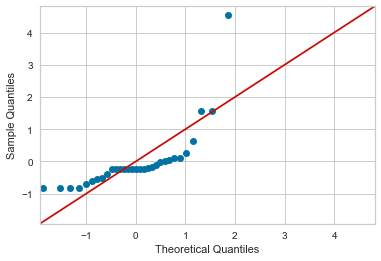

...

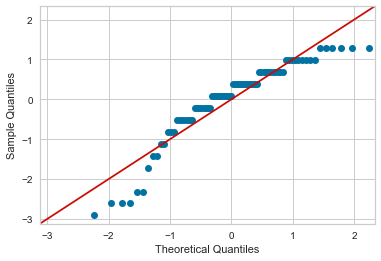

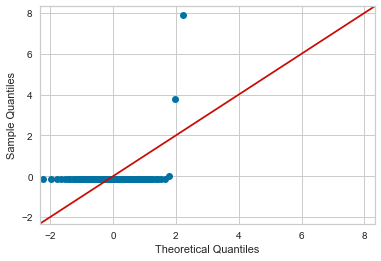

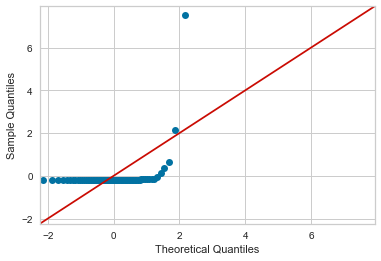

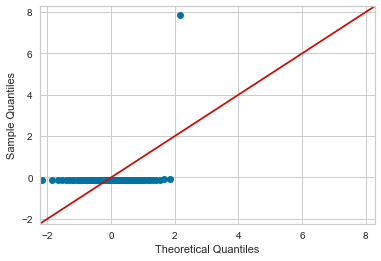

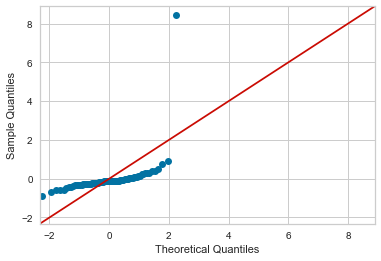

In [103]:
# calling the function
for i in train.columns[1:-1]:
    plot_qqplot_no(train,i)

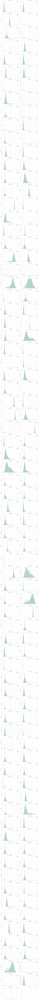

In [104]:
# calling the function to visualize
plot_kde(train,train.columns[1:-1])

In [105]:
right_skewed_cols = ["M1","M2","M8","M9","M10","M11","M12","M15","M17","M20","M21","M23","M24","M25",
                    "M26","M27","M28","M29","M30","M32","M33","M35","M36","M37","M38","M45","M46",
                    "M47","M48","M49","M51","M51","M52","M57","M58","M59","M64","M67","M68","M69",
                    "M70","M71","M72","M73","M74","M75","M76","M77","M78","M79","M80","M81","M82",
                    "M83","M84","M88","M89","M90","M91","M93","M96","M97","M98","M99","M100","M103",
                    "M104","M105","M106","M107","M108","M109","M110","M11","M114","M115","M116","M117",
                    "M118","M119","M120","M121","M122","M123","M124","M125","M126","M127","M128","M129",
                    "M130","M131","M132","M134","M135","M137","M138","M139","M140","M141","M142","M143",
                    "M144","M145","M146","M150"]

In [106]:
approx_normal_cols = ["M3","M4","M5","M6","M7","M13","M14","M16","M18","M19","M22","M34","M40","M41",
                      "M42","M44","M50","M53","M54","M55","M56","M60","M61","M62","M65","M66","M85",
                      "M86","M95","M101","M102","M112","M113","M133","M136","M148","M149","M151"] 

In [107]:
left_skewed_cols = ["M31","M39","M43","M63","M87","M92","M94","M147"]

In [108]:
print("Count of right skewed columns", len(right_skewed_cols))
print("\n")
print("Count of left skewed columns", len(left_skewed_cols))
print("\n")
print("Count of Approx normal columns", len(approx_normal_cols))

Count of right skewed columns 106


Count of left skewed columns 8


Count of Approx normal columns 38


Insights:

1. All columns are not normally distributed


2. Approximately I can say that by visualising, Skewness and Kurtosis score 


    i. 106 columns are right skewed
    
    ii. 8 columns are left skewed
    
    iii. 38 columns are approx normal distributed

#### Test Dataset

##### Null Value Analysis

In [109]:
# get the columns with null values in test
null_cols_test = test.isnull().any(axis=0)
null_cols_test = null_cols_test[null_cols_test].index.tolist()

In [110]:
len(null_cols_test)

96

In [111]:
# calling the null value percentage function in test dataset
for i in null_cols_test:
    nullcol(test,i)

Missing values percentage M2 : 2.27%


Missing values percentage M3 : 37.50%


Missing values percentage M5 : 77.27%


Missing values percentage M7 : 50.00%


Missing values percentage M8 : 5.68%


Missing values percentage M9 : 2.27%


Missing values percentage M10 : 4.55%


Missing values percentage M12 : 12.50%


Missing values percentage M14 : 4.55%


Missing values percentage M16 : 2.27%


Missing values percentage M17 : 2.27%


Missing values percentage M20 : 2.27%


Missing values percentage M21 : 2.27%


Missing values percentage M22 : 2.27%


Missing values percentage M25 : 48.86%


Missing values percentage M29 : 2.27%


Missing values percentage M30 : 53.41%


Missing values percentage M31 : 2.27%


Missing values percentage M32 : 17.05%


Missing values percentage M33 : 62.50%


Missing values percentage M34 : 25.00%


Missing values percentage M35 : 5.68%


Missing values percentage M36 : 70.45%


Missing values percentage M37 : 2.27%


Missing values percentage M38 : 2.27

In [112]:
# Null value percentage with parameters
null_value_less_than_10 = []
null_value_less_than_50_and_greater_than_10 = []
null_value_greater_than_50 = []

# calling the null value percentage perameter function in Test dataset
for i in null_cols_test:
    nullcol_perameter(test,i)

In [113]:
print("\033[1m" + "null value less than 10% in Test" + "\033[0m")
print(null_value_less_than_10)
print("length", len(null_value_less_than_10))
print("\n")
print("\033[1m" + "null value less than 50 and greater than 10% in Test" + "\033[0m")
print(null_value_less_than_50_and_greater_than_10)
print("length", len(null_value_less_than_50_and_greater_than_10)) 
print("\n")
print("\033[1m" + "null value greater than 50% in Test" + "\033[0m")
print(null_value_greater_than_50)
print("length", len(null_value_greater_than_50))

null value less than 10% in Test
['M2', 'M8', 'M9', 'M10', 'M14', 'M16', 'M17', 'M20', 'M21', 'M22', 'M29', 'M31', 'M35', 'M37', 'M38', 'M42', 'M43', 'M44', 'M48', 'M50', 'M51', 'M55', 'M56', 'M65', 'M67', 'M73', 'M74', 'M78', 'M79', 'M80', 'M82', 'M83', 'M84', 'M87', 'M90', 'M91', 'M92', 'M94', 'M100', 'M101', 'M105', 'M106', 'M108', 'M109', 'M111', 'M112', 'M116', 'M117', 'M124', 'M125', 'M126', 'M129', 'M130', 'M132', 'M133', 'M134', 'M142', 'M143', 'M146', 'M147', 'M151']
length 61


null value less than 50 and greater than 10% in Test
['M3', 'M12', 'M25', 'M32', 'M34', 'M41', 'M52', 'M53', 'M62', 'M63', 'M71', 'M81', 'M86', 'M95', 'M96', 'M97', 'M102', 'M103', 'M107', 'M113', 'M135', 'M137', 'M149', 'M150']
length 24


null value greater than 50% in Test
['M5', 'M7', 'M30', 'M33', 'M36', 'M39', 'M40', 'M46', 'M49', 'M64', 'M72']
length 11


In [115]:
# checking for columns which has null value in Train as well as Test data
lst2 = []
for i in null_cols_train:
    for j in null_cols_test:
        if i == j:
            lst2.append(i)
len(lst2)

96

Insights: 

> These 96 features are same that has null values in Train Dataset also

> there are 61 features that have null values less than 10%

> there are 24 features that have null values less than 50% and more than 10%

> there are 11 features that have null values more than 50%

##### Infinity Value Analysis

In [116]:
# Check which columns contain infinity values
cols_with_inf_test = test.columns[np.isinf(test).any()].tolist()

# Print the columns containing infinity values
print("Columns with infinity values:", cols_with_inf_test)

Columns with infinity values: ['M5', 'M7', 'M34', 'M36', 'M53', 'M95', 'M148', 'M149', 'M150']


In [117]:
# Number of columns have infinity value
len(cols_with_inf_test)

9

In [118]:
# checking that train outlier col list match or not with test outlier col list
if all(elem in cols_with_inf for elem in cols_with_inf_test):
    print(True)
else:
    print(False)

False


Insights:

1. There are 9 features that has infinity values
2. There are some features in those 9 which is not common in Train data in case of infinity value

##### Unique Value Analysis

In [119]:
# checking if there is column which has less than 25 unique values in Test Data
# I am assuming that maybe it is encoded so we will check it in deep analysis
unique_value_list = []
for i in test.columns.tolist()[1:-1]:
    if (test[i].nunique()<20):
        unique_value_list.append(i)

print(unique_value_list)
print("\n")
print("count of unique value list", len(unique_value_list))

['M5', 'M9', 'M15', 'M21', 'M26', 'M27', 'M33', 'M35', 'M36', 'M38', 'M43', 'M44', 'M46', 'M47', 'M52', 'M58', 'M69', 'M70', 'M72', 'M73', 'M91', 'M92', 'M106', 'M108', 'M109', 'M128', 'M129', 'M130', 'M147']


count of unique value list 29


In [120]:
list2 = unique_value_list

In [121]:
# checking that train nuniuque col list match or not with test nunique col list
if all(elem in list2 for elem in list1):
    print(True)
else:
    print(False)

True


Insights:

1. There is 29 features that have less than 20 no of unique class

2. In this 29 features there are 7 same features that has train nunique column list 

##### Outlier Analysis

In [122]:
outliers_cols = []

In [123]:
# calling the function
outliers_list_col(test,test.columns.tolist()[1:-1])

['M1',
 'M4',
 'M6',
 'M11',
 'M13',
 'M15',
 'M18',
 'M19',
 'M23',
 'M24',
 'M26',
 'M27',
 'M28',
 'M45',
 'M47',
 'M54',
 'M57',
 'M58',
 'M59',
 'M60',
 'M61',
 'M66',
 'M68',
 'M69',
 'M70',
 'M75',
 'M76',
 'M77',
 'M85',
 'M89',
 'M93',
 'M98',
 'M99',
 'M104',
 'M110',
 'M114',
 'M115',
 'M118',
 'M119',
 'M120',
 'M121',
 'M122',
 'M123',
 'M127',
 'M128',
 'M131',
 'M136',
 'M138',
 'M139',
 'M140',
 'M141',
 'M144',
 'M145',
 'M148']

In [124]:
# 54 cols have outliers
len(outliers_cols)

54

In [125]:
list4 = outliers_cols

In [126]:
# checking that train outlier col list match or not with test outlier col list
if all(elem in list3 for elem in list4):
    print(True)
else:
    print(False)

True


Insights:

1. There are 54 features that has outliers in Test Dataset
2. In those 54 features there is same 54 features that has null values in Train Dataset also 

#### OOT dataset

##### Null Value Analysis

In [127]:
# get the columns with null values in oot
null_cols_ott = OOT_data.isnull().any(axis=0)
null_cols_ott = null_cols_ott[null_cols_ott].index.tolist()

In [128]:
len(null_cols_ott)

92

In [129]:
# calling the null value percentage function in OOT dataset
for i in null_cols_ott:
    nullcol(OOT_data,i)

Missing values percentage M2 : 1.14%


Missing values percentage M3 : 39.77%


Missing values percentage M5 : 75.00%


Missing values percentage M7 : 55.68%


Missing values percentage M8 : 3.41%


Missing values percentage M9 : 1.14%


Missing values percentage M10 : 3.41%


Missing values percentage M12 : 10.23%


Missing values percentage M14 : 2.27%


Missing values percentage M16 : 1.14%


Missing values percentage M20 : 1.14%


Missing values percentage M21 : 1.14%


Missing values percentage M22 : 1.14%


Missing values percentage M25 : 57.95%


Missing values percentage M29 : 1.14%


Missing values percentage M30 : 56.82%


Missing values percentage M31 : 1.14%


Missing values percentage M32 : 6.82%


Missing values percentage M33 : 50.00%


Missing values percentage M34 : 20.45%


Missing values percentage M35 : 3.41%


Missing values percentage M36 : 67.05%


Missing values percentage M37 : 1.14%


Missing values percentage M38 : 1.14%


Missing values percentage M39 : 54.55

In [130]:
# Null value percentage with parameters
null_value_less_than_10 = []
null_value_less_than_50_and_greater_than_10 = []
null_value_greater_than_50 = []

# calling the null value percentage perameter function in OOT dataset
for i in null_cols_ott:
    nullcol_perameter(OOT_data,i)

In [131]:
print("\033[1m" + "null value less than 10% in OOT Data" + "\033[0m")
print(null_value_less_than_10)
print("length", len(null_value_less_than_10))
print("\n")
print("\033[1m" + "null value less than 50 and greater than 10% in OOT Data" + "\033[0m")
print(null_value_less_than_50_and_greater_than_10)
print("length", len(null_value_less_than_50_and_greater_than_10)) 
print("\n")
print("\033[1m" + "null value greater than 50% in OOT Data" + "\033[0m")
print(null_value_greater_than_50)
print("length", len(null_value_greater_than_50))

null value less than 10% in OOT Data
['M2', 'M8', 'M9', 'M10', 'M14', 'M16', 'M20', 'M21', 'M22', 'M29', 'M31', 'M32', 'M35', 'M37', 'M38', 'M42', 'M43', 'M44', 'M48', 'M50', 'M51', 'M55', 'M56', 'M62', 'M67', 'M73', 'M74', 'M78', 'M80', 'M82', 'M83', 'M84', 'M87', 'M90', 'M91', 'M92', 'M94', 'M100', 'M101', 'M105', 'M106', 'M108', 'M109', 'M111', 'M112', 'M116', 'M117', 'M124', 'M125', 'M126', 'M129', 'M130', 'M132', 'M133', 'M134', 'M142', 'M143', 'M147', 'M151']
length 59


null value less than 50 and greater than 10% in OOT Data
['M3', 'M12', 'M34', 'M41', 'M52', 'M53', 'M63', 'M71', 'M81', 'M86', 'M95', 'M96', 'M97', 'M102', 'M103', 'M107', 'M113', 'M135', 'M137', 'M149', 'M150']
length 21


null value greater than 50% in OOT Data
['M5', 'M7', 'M25', 'M30', 'M33', 'M36', 'M39', 'M40', 'M46', 'M49', 'M64', 'M72']
length 12


In [133]:
# checking for columns which has null value in Train, Test as well as OTT data
lst3 = []
for i in null_cols_train:
    for j in null_cols_ott:
        if i == j:
            lst3.append(i)
len(lst3)

92

In [134]:
# finding out the 4 cols which does not null value in OTT dataset but have null values in Train and Test Dataset

# Convert the lists to sets and find the unique items
unique_items = set(lst2) ^ set(lst3)

# Convert the set back to a list
unique_items_list = list(unique_items)

# Print the result
print(unique_items_list)

['M146', 'M79', 'M65', 'M17']


Insights: 

> Only 4 columns i.e., {'M79', 'M65', 'M146', 'M17'} has not null value in OTT dataset but have null values in Train and Test Dataset

> there are 59 features that have null values less than 10%

> there are 21 features that have null values less than 50% and more than 10%

> there are 12 features that have null values more than 50%

##### Unique Value Analysis

In [135]:
# checking if there is column which has less than 25 unique values in Test Data
# I am assuming that maybe it is encoded so we will check it in deep analysis
unique_value_list = []
for i in OOT_data.columns.tolist()[1:]:
    if (OOT_data[i].nunique()<20):
        unique_value_list.append(i)

print(unique_value_list)
print("\n")
print("count of unique value list", len(unique_value_list))

['M5', 'M9', 'M15', 'M21', 'M26', 'M27', 'M33', 'M35', 'M36', 'M38', 'M43', 'M44', 'M46', 'M47', 'M52', 'M58', 'M69', 'M70', 'M72', 'M73', 'M79', 'M91', 'M92', 'M106', 'M108', 'M109', 'M128', 'M129', 'M130', 'M147']


count of unique value list 30


In [136]:
list5 = unique_value_list

In [137]:
# checking that train nuniuque col list match or not with test nunique col list
if all(elem in list1 for elem in list5):
    print(True)
else:
    print(False)

False


Insights:

1. There is 30 features that have less than 20 no of unique class

2. In this 30 features there are not matching with Train Data nunique class list as well as Test Data nunique class list

##### Infinity Value Analysis

In [138]:
# Check which columns contain infinity values
cols_with_inf_oot = OOT_data.columns[np.isinf(OOT_data).any()].tolist()

# Print the columns containing infinity values
print("Columns with infinity values:", cols_with_inf_oot)

Columns with infinity values: ['M5', 'M7', 'M36', 'M53', 'M95', 'M148', 'M149', 'M150', 'M151']


In [139]:
# number of cols 
len(cols_with_inf_oot)

9

In [140]:
# checking that train outlier col list match or not with test outlier col list
if all(elem in cols_with_inf_test for elem in cols_with_inf_oot):
    print(True)
else:
    print(False)

False


Insights:

1. There are 9 features has inifnity values in OOT data
2. There are not common in Train as well as Test in case of infinity value

##### Outlier Analysis

In [141]:
outliers_cols = []

In [142]:
# Defining a function of cols that has outliers or not
def outliers_list_col_oot(data, num_cols, threshold=1.5):
    for col in num_cols:
        # Calculate the first and third quartiles and interquartile range (IQR)
        q1 = np.percentile(data[col], 25)
        q3 = np.percentile(data[col], 75)
        iqr = q3 - q1

        # Define the outlier threshold as threshold times the IQR below the first quartile or above the third quartile
        lower_threshold = q1 - threshold * iqr
        upper_threshold = q3 + threshold * iqr

        # Identify the outliers in the column for each class label
        outliers_class = ((data[col] < lower_threshold) | (data[col] > upper_threshold))

        # Check if the column contains outliers and append the column name to the list if it does
        if not outliers_class.empty:
            outliers_cols.append(col)

In [143]:
# calling the function
outliers_list_col_oot(OOT_data,OOT_data.columns.tolist()[1:])

In [144]:
# 151 cols have outliers
len(outliers_cols)

151

In [145]:
list5 = outliers_cols

In [146]:
# checking that train outlier col list match or not with test outlier col list
if all(elem in list3 for elem in list4):
    print(True)
else:
    print(False)

True


Insights:

1. There are 151 features that has outliers in OOT Dataset
2. In those 151 features there is same 56 features that has null values in Train Dataset also as well as same 121 features that has null values in Test Dataset also

# Statistical Analysis

> To find the relationship between a categorical target variable and numerical independent variables, we use a statistical test called Analysis of Variance (ANOVA).

> The null hypothesis (H0) is that there is no significant difference in the mean value of the numerical variable across different groups defined by the categorical variable.

> The alternative hypothesis (Ha) is that there is a significant difference in the mean value of the numerical variable across at least one pair of groups defined by the categorical variable.

In [147]:
# making a copy 
train_1 = train.copy()

In [148]:
# for statiscal analysis - cols should not have null so I make a copy of train and treat them so to get statistical analysis

# Impute missing values with mean in copy data
train_1 = train_1.fillna(train_1.mean())

results = {}
for column in train_1.columns[1:-1]:
    group1 = train_1[column][train_1["target"] == 1]
    group2 = train_1[column][train_1["target"] == 0]
    f_value, p_value = f_oneway(group1, group2)
    results[column] = {"F-value": f_value, "p-value": p_value}

# Print results
for column in results:
    print("\033[1m" + column.upper() + " :" + "\033[0m", "F-value:", results[column]["F-value"], "p-value:", results[column]["p-value"])


M1 : F-value: 0.6115667386830507 p-value: 0.43476963521799095
M2 : F-value: 0.44314879239990795 p-value: 0.5060802082279895
M3 : F-value: 1.7671247496794147 p-value: 0.18467355833791124
M4 : F-value: 4.087223236279278 p-value: 0.04403024770462909
M5 : F-value: 6.61817083363948 p-value: 0.010539243230848169
M6 : F-value: 5.568733157694114 p-value: 0.018876546250187993
M7 : F-value: nan p-value: nan
M8 : F-value: 1.3553726861779316 p-value: 0.2451975902842315
M9 : F-value: 3.0026219297536776 p-value: 0.08408140355318959
M10 : F-value: 0.11818150681796076 p-value: 0.7312382069996151
M11 : F-value: 1.6665844569739043 p-value: 0.19763699944349405
M12 : F-value: 0.28784837032550964 p-value: 0.5919708364950116
M13 : F-value: 4.083902054551878 p-value: 0.04411573448244134
M14 : F-value: 4.502836618393206 p-value: 0.03459717489638845
M15 : F-value: 8.92688166621634 p-value: 0.003024599758536263
M16 : F-value: 4.398018525384152 p-value: 0.036755443390967917
M17 : F-value: 14.76945683989547 p-val

> A p-value less than 0.05 indicates that there is evidence of a significant difference in the means of the numerical variable between the two groups (i.e., the feature is related to the target variable). 

>Conversely, a p-value greater than 0.05 indicates that there is no significant difference in the means of the numerical variable between the two groups (i.e., the feature is not related to the target variable).

In [149]:
significant_cols = [col for col, result in results.items() if result['p-value'] < 0.05]

In [150]:
# number of Significant cols in Train Data
len(significant_cols)

77

Insights:

1. There is 77 number of significant columns in Train Data which has p value less than 0.05.

# Data Preprocessing of Train, Test and OOT data

>Data Preprocessing part is done only on Training dataset.

>Not on Test Dataset because model will become overfit

>I have done deep analysis to find out the data behaviour in Train, test and OOT dataset before preprocessing so that I can treat accordingly 

> I am doing preprocessing of test and unseen data according to test data

## Dropping Unnecessary Variables

In [151]:
train.head()

,Unnamed: 0,M1,M2,M3,M4,M5,M6,M7,M8,M9,...,M143,M144,M145,M146,M147,M148,M149,M150,M151,target
0,320,2.240789e+08,0.0,0.0,8.142857,1.5,2.857143,2.387105,5.720456e+07,0.0,...,0.142857,1.428571,5.943793e+06,3.714286,8.0,1.137554,NaN,8.426000,0.914831,0
1,556,5.454261e+06,6138990.0,0.0,5.142857,NaN,0.285714,1.029878,1.694720e+08,0.0,...,0.285714,1.285714,4.264630e+06,2.600000,10.0,0.940661,2.000506,inf,1.016467,1
2,421,2.359738e+07,1272552.0,0.0,3.428571,NaN,4.000000,1.103578,1.852271e+07,16.0,...,6.714286,9.142857,1.321201e+07,6.500000,13.0,1.007713,0.502552,1.157555,0.988912,0
3,184,2.243215e+08,0.0,0.0,3.285714,NaN,10.714286,NaN,1.050155e+06,0.0,...,0.000000,6.000000,7.029361e+08,11.500000,0.0,1.504471,2.827495,0.670929,0.483688,0
4,496,6.892245e+07,0.0,0.0,3.285714,1.0,1.857143,0.000000,NaN,0.0,...,0.000000,0.142857,1.230383e+06,0.833333,2.0,inf,inf,NaN,0.600029,1


In [152]:
# Dropping First column which is not required
train.drop(columns=train.columns[0], axis=1,  inplace=True)

In [153]:
train.head()

,M1,M2,M3,M4,M5,M6,M7,M8,M9,M10,...,M143,M144,M145,M146,M147,M148,M149,M150,M151,target
0,2.240789e+08,0.0,0.0,8.142857,1.5,2.857143,2.387105,5.720456e+07,0.0,651246451.0,...,0.142857,1.428571,5.943793e+06,3.714286,8.0,1.137554,NaN,8.426000,0.914831,0
1,5.454261e+06,6138990.0,0.0,5.142857,NaN,0.285714,1.029878,1.694720e+08,0.0,402015474.0,...,0.285714,1.285714,4.264630e+06,2.600000,10.0,0.940661,2.000506,inf,1.016467,1
2,2.359738e+07,1272552.0,0.0,3.428571,NaN,4.000000,1.103578,1.852271e+07,16.0,124910611.0,...,6.714286,9.142857,1.321201e+07,6.500000,13.0,1.007713,0.502552,1.157555,0.988912,0
3,2.243215e+08,0.0,0.0,3.285714,NaN,10.714286,NaN,1.050155e+06,0.0,1362655.0,...,0.000000,6.000000,7.029361e+08,11.500000,0.0,1.504471,2.827495,0.670929,0.483688,0
4,6.892245e+07,0.0,0.0,3.285714,1.0,1.857143,0.000000,NaN,0.0,400018121.0,...,0.000000,0.142857,1.230383e+06,0.833333,2.0,inf,inf,NaN,0.600029,1


In [154]:
# Dropping First column which is not required in test and oot data
test.drop(columns=test.columns[0], axis=1,  inplace=True)
OOT_data.drop(columns=OOT_data.columns[0], axis=1,  inplace=True)

## Treatment of Infinity Value

Treatment of infinity value is important as it decrease outliers and helps in Null value treatment

In [155]:
# Replace inf values with highest representable float value
train.replace([np.inf, -np.inf], np.finfo(np.float64).max, inplace=True)

In [156]:
# Check which columns contain infinity values
cols_with_inf_train_1 = train.columns[np.isinf(train).any()].tolist()

# Print the columns containing infinity values
print("Columns with infinity values:", cols_with_inf_train_1)

Columns with infinity values: []


In [157]:
train.head()

,M1,M2,M3,M4,M5,M6,M7,M8,M9,M10,...,M143,M144,M145,M146,M147,M148,M149,M150,M151,target
0,2.240789e+08,0.0,0.0,8.142857,1.5,2.857143,2.387105,5.720456e+07,0.0,651246451.0,...,0.142857,1.428571,5.943793e+06,3.714286,8.0,1.137554e+00,NaN,8.426000e+00,0.914831,0
1,5.454261e+06,6138990.0,0.0,5.142857,NaN,0.285714,1.029878,1.694720e+08,0.0,402015474.0,...,0.285714,1.285714,4.264630e+06,2.600000,10.0,9.406614e-01,2.000506e+00,1.797693e+308,1.016467,1
2,2.359738e+07,1272552.0,0.0,3.428571,NaN,4.000000,1.103578,1.852271e+07,16.0,124910611.0,...,6.714286,9.142857,1.321201e+07,6.500000,13.0,1.007713e+00,5.025517e-01,1.157555e+00,0.988912,0
3,2.243215e+08,0.0,0.0,3.285714,NaN,10.714286,NaN,1.050155e+06,0.0,1362655.0,...,0.000000,6.000000,7.029361e+08,11.500000,0.0,1.504471e+00,2.827495e+00,6.709289e-01,0.483688,0
4,6.892245e+07,0.0,0.0,3.285714,1.0,1.857143,0.000000,NaN,0.0,400018121.0,...,0.000000,0.142857,1.230383e+06,0.833333,2.0,1.797693e+308,1.797693e+308,NaN,0.600029,1


All cols which has infinity value is treated

In [158]:
# Replace infinity values in columns with max float64 value in test and OOT data

# Replace inf values with highest representable float value
test.replace([np.inf, -np.inf], np.finfo(np.float64).max, inplace=True)

# Replace inf values with highest representable float value
OOT_data.replace([np.inf, -np.inf], np.finfo(np.float64).max, inplace=True)

## Outlier Treatment

In [159]:
# Treat outliers in Train
for col in train.columns[:-1]:
    Q1 = train[col].quantile(0.25)
    Q3 = train[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5*IQR
    upper_bound = Q3 + 1.5*IQR
    train[col] = train[col].apply(lambda x: lower_bound if x < lower_bound else (upper_bound if x > upper_bound else x))
    
# Treat outliers in Test
for col in test.columns[:-1]:
    Q1 = test[col].quantile(0.25)
    Q3 = test[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5*IQR
    upper_bound = Q3 + 1.5*IQR
    test[col] = test[col].apply(lambda x: lower_bound if x < lower_bound else (upper_bound if x > upper_bound else x))
    
# Treat outliers in OOT Data
for col in OOT_data.columns:
    Q1 = OOT_data[col].quantile(0.25)
    Q3 = OOT_data[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5*IQR
    upper_bound = Q3 + 1.5*IQR
    OOT_data[col] = OOT_data[col].apply(lambda x: lower_bound if x < lower_bound else (upper_bound if x > upper_bound else x))

In [160]:
train.shape, test.shape

((326, 152), (88, 152))

Outlier treatment done

## Treatment of Missing Value

Treatment of Missing Value I have in three ways:


1. Columns which has null value less then 10% - I will treat this with Simple Imputation


2. Columns which has null value greater than 10% and less than 50% - I will treat this with MICE


3. Columns which has null value greater than 50% - I will drop that columns

In [161]:
train.isnull().any().sum()
# total number of features with null value

96

### Simple Imputation - for less than 10%

There is 62 features which has null values and less than 10%

#### Train

##### Median

As I found out that there is there is outliers so I treat all columns with Median.
Then Mean imputation is best

In [162]:
len(null_value_less_than_10_train)

62

In [163]:
# Loop through cols and replace missing values with mean
for col in null_value_less_than_10_train:
#     mean_value = train[col].mean()
    median_value = train[col].median()
    train[col].fillna(value=median_value, inplace=True)

In [164]:
# Checking the null value
train[null_value_less_than_10_train].isnull().any().sum()

0

All null values of cols less than 10% null value treated

#### Test

In [165]:
# Loop through cols and replace missing values with mean
for col in null_value_less_than_10_train:
#     mean_value = test[col].mean()
    median_value = test[col].median()
    test[col].fillna(value=median_value, inplace=True)

#### OOT Data

In [166]:
# Loop through cols and replace missing values with mean
for col in null_value_less_than_10_train:
#     mean_value = OOT_data[col].mean()
    median_value = OOT_data[col].median()
    OOT_data[col].fillna(value=median_value, inplace=True)

### MICE Imputation - for greater than 10% and less than 50%

before mice treatment we have to treat outliers

In [167]:
len(null_value_less_than_50_and_greater_than_10_train)

22

In [168]:
# Impute missing values using MICE with k-NN method
imputed_df = pd.DataFrame(KNN(k=5).fit_transform(train[null_value_less_than_50_and_greater_than_10_train]), columns=null_value_less_than_50_and_greater_than_10_train)

# Merge the imputed values with the original dataset
train[null_value_less_than_50_and_greater_than_10_train] = imputed_df

Imputing row 1/326 with 3 missing, elapsed time: 0.032
Imputing row 101/326 with 8 missing, elapsed time: 0.040
Imputing row 201/326 with 15 missing, elapsed time: 0.048
Imputing row 301/326 with 17 missing, elapsed time: 0.056


In [169]:
train[null_value_less_than_50_and_greater_than_10_train].isnull().any().sum()

0

In [170]:
# Impute missing values using MICE with k-NN method
imputed_df_1 = pd.DataFrame(KNN(k=5).fit_transform(test[null_value_less_than_50_and_greater_than_10_train]), columns=null_value_less_than_50_and_greater_than_10_train)

# Merge the imputed values with the original dataset
test[null_value_less_than_50_and_greater_than_10_train] = imputed_df_1

# Impute missing values using MICE with k-NN method
imputed_df_2= pd.DataFrame(KNN(k=5).fit_transform(OOT_data[null_value_less_than_50_and_greater_than_10_train]), columns=null_value_less_than_50_and_greater_than_10_train)

# Merge the imputed values with the original dataset
OOT_data[null_value_less_than_50_and_greater_than_10_train] = imputed_df_2

Imputing row 1/88 with 14 missing, elapsed time: 0.000
Imputing row 1/88 with 10 missing, elapsed time: 0.008


Null Value of cols which has more than 10% and less than 50% treated

### Dropping Cols with >50% null values

In [171]:
# Drop the columns
train = train.drop(null_value_greater_than_50_train, axis=1)

In [172]:
test = test.drop(null_value_greater_than_50_train, axis=1)
OOT_data = OOT_data.drop(null_value_greater_than_50_train, axis=1)

In [173]:
train.shape, test.shape, OOT_data.shape

((326, 140), (88, 140), (88, 139))

## Data Normalization

I did Data Normalization by Standard Scale to scale the data as all columns are numerical

In [176]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
train[train.columns[:-1]] = scaler.fit_transform(train[train.columns[:-1]])

In [177]:
scaler = StandardScaler()
test[test.columns[:-1]] = scaler.fit_transform(test[test.columns[:-1]])

In [178]:
# Replace inf values with highest representable float value
OOT_data.replace([np.inf, -np.inf], np.finfo(np.float64).max, inplace=True)


scaler = StandardScaler()
OOT_data[OOT_data.columns] = scaler.fit_transform(OOT_data[OOT_data.columns])

In [179]:
train.head()

,M1,M2,M3,M4,M6,M8,M9,M10,M11,M12,...,M143,M144,M145,M146,M147,M148,M149,M150,M151,target
0,1.330464,-0.609640,-0.722033,1.505136,-0.262688,-0.382025,-0.647539,0.247475,0.128450,0.855238,...,-0.751382,-0.300056,-0.674477,0.300173,0.014809,-0.362524,0.534917,2.128435,-0.460043,0
1,-0.770445,-0.325666,-0.722033,0.545348,-1.020207,0.411288,-0.647539,-0.159828,-0.697694,-0.713963,...,-0.624988,-0.358871,-0.691079,-0.125883,0.497587,-0.539650,-0.477783,2.128435,0.197390,1
2,-0.596096,-0.550775,-0.722033,-0.003102,0.073986,-0.655362,1.997795,-0.612685,-0.140532,-0.108766,...,2.092470,2.133451,-0.602616,1.365313,1.221754,-0.479331,-0.750933,-0.370631,0.019148,0
3,1.332795,-0.609640,-0.722033,-0.048806,2.051951,-0.778828,-0.647539,-0.814592,1.887660,-0.713963,...,-0.877775,1.582052,2.187893,2.130030,-1.916303,-0.032442,-0.326983,-0.610312,-1.839125,0
4,-0.160537,-0.609640,-0.722033,-0.048806,-0.557279,-0.460020,-0.647539,-0.163093,-0.697694,-0.711989,...,-0.877775,-0.829398,-0.721078,-0.801383,-1.433525,1.796386,1.757862,0.127534,-1.839125,1


## Multicolineraity

> Multicollinearity occurs when two or more predictor variables in a regression model are highly correlated with each other. This can lead to unstable and unreliable estimates of the coefficients of the predictor variables, and can make it difficult to interpret the results of the model analysis.

### Heat Map

<AxesSubplot: >

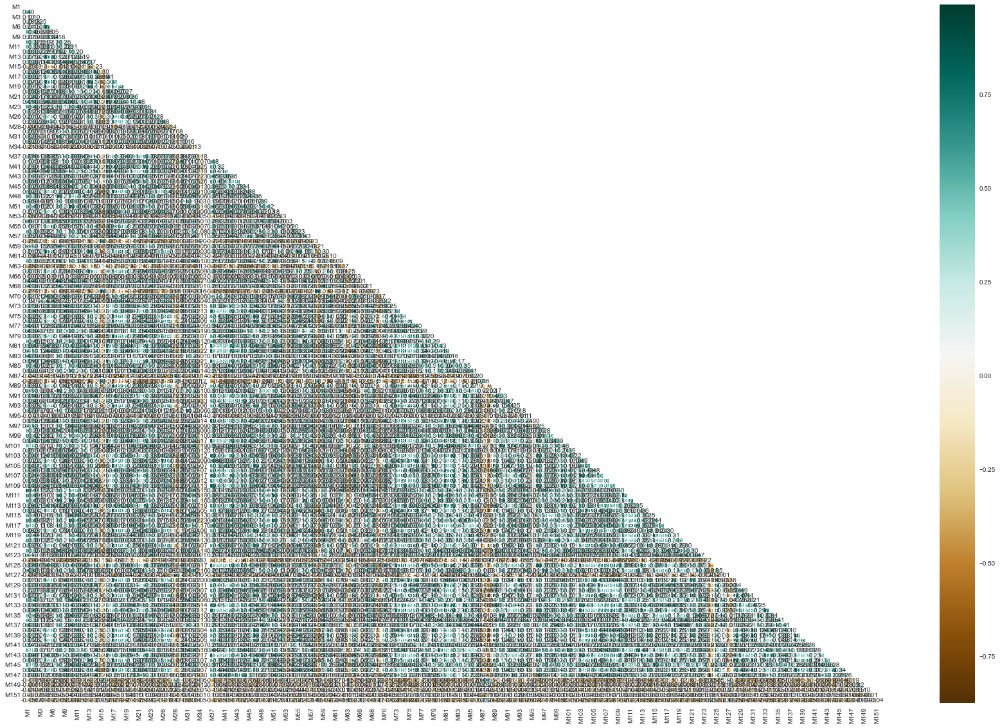

In [180]:
matrix = np.triu(train.corr())
plt.figure(figsize=(30,20))
sns.heatmap(train.corr(), annot=True, fmt= '.2f', cmap='BrBG', linewidths = 2,mask=matrix)

### VIF

In [181]:
len(train.columns[np.isinf(train).any()].tolist())
train.shape

(326, 140)

In [182]:
# the VIF score for each feature
threshold = 10

X_vif = train.drop('target', axis=1)
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(X_vif.values, i) for i in range(X_vif.shape[1])]
vif["features"] = X_vif.columns

# Sort the features based on their VIF score
vif_sorted = vif.sort_values("VIF Factor", ascending=False)

# Select the features with a VIF score less than the threshold
# selected_features = vif_sorted[vif_sorted["VIF Factor"] < threshold]["features"].tolist()

In [183]:
train.head()

,M1,M2,M3,M4,M6,M8,M9,M10,M11,M12,...,M143,M144,M145,M146,M147,M148,M149,M150,M151,target
0,1.330464,-0.609640,-0.722033,1.505136,-0.262688,-0.382025,-0.647539,0.247475,0.128450,0.855238,...,-0.751382,-0.300056,-0.674477,0.300173,0.014809,-0.362524,0.534917,2.128435,-0.460043,0
1,-0.770445,-0.325666,-0.722033,0.545348,-1.020207,0.411288,-0.647539,-0.159828,-0.697694,-0.713963,...,-0.624988,-0.358871,-0.691079,-0.125883,0.497587,-0.539650,-0.477783,2.128435,0.197390,1
2,-0.596096,-0.550775,-0.722033,-0.003102,0.073986,-0.655362,1.997795,-0.612685,-0.140532,-0.108766,...,2.092470,2.133451,-0.602616,1.365313,1.221754,-0.479331,-0.750933,-0.370631,0.019148,0
3,1.332795,-0.609640,-0.722033,-0.048806,2.051951,-0.778828,-0.647539,-0.814592,1.887660,-0.713963,...,-0.877775,1.582052,2.187893,2.130030,-1.916303,-0.032442,-0.326983,-0.610312,-1.839125,0
4,-0.160537,-0.609640,-0.722033,-0.048806,-0.557279,-0.460020,-0.647539,-0.163093,-0.697694,-0.711989,...,-0.877775,-0.829398,-0.721078,-0.801383,-1.433525,1.796386,1.757862,0.127534,-1.839125,1


Insights:

1. I didn't select VIF features it may become information loss for the model to remove features that come as VIF score more than 10 which means it is highly correlated to each other

## Feature Separation

In [184]:
X = train.drop("target", axis= 1)
y = train[["target"]]

In [185]:
X1 = test.drop("target", axis= 1)
y2 = test[["target"]]

## Treatment of Imbalance Dataset

SMOTE for imbalanced (oversampling)

In [186]:
X, y = SMOTE().fit_resample(X, y)

In [187]:
X1, y2 = SMOTE().fit_resample(X1, y2)

## Feature Engine

In [188]:
constant = DropConstantFeatures(tol=1)
constant.fit(X)
len(constant.features_to_drop_)
# show the names of the first 2 constant features

constant.features_to_drop_

['M35']

In [189]:
quasi_constant = DropConstantFeatures(tol=0.998)

quasi_constant.fit(X)

len(constant.features_to_drop_)
quasi_constant.features_to_drop_

['M35']

In [190]:
# removing variables

print('Number of variables before removing : ', X.shape[1])

X = quasi_constant.transform(X)

print('Number of variables after removing : ', X.shape[1])

Number of variables before removing :  139
Number of variables after removing :  138


In [191]:
duplicates = DropDuplicateFeatures()

duplicates.fit(X)

duplicates.duplicated_feature_sets_

[]

In [192]:
correlated = DropCorrelatedFeatures(variables=None, method='pearson', threshold=0.8)

correlated.fit(X)

correlated.correlated_feature_sets_

[{'M1', 'M110'},
 {'M18', 'M19', 'M4', 'M6'},
 {'M112', 'M8'},
 {'M10', 'M51'},
 {'M13', 'M60'},
 {'M113', 'M14', 'M42'},
 {'M16', 'M22'},
 {'M105',
  'M114',
  'M118',
  'M121',
  'M131',
  'M138',
  'M139',
  'M140',
  'M144',
  'M146',
  'M17',
  'M75',
  'M76',
  'M89',
  'M93'},
 {'M127', 'M28'},
 {'M31', 'M94'},
 {'M100',
  'M109',
  'M125',
  'M134',
  'M143',
  'M37',
  'M74',
  'M81',
  'M82',
  'M84',
  'M96'},
 {'M124', 'M43', 'M92'},
 {'M56', 'M80'},
 {'M126', 'M78'},
 {'M104', 'M79'},
 {'M132', 'M83'},
 {'M119', 'M85'},
 {'M101', 'M90'},
 {'M120', 'M99'},
 {'M103', 'M107'},
 {'M111', 'M117'}]

In [193]:
smart_corr = SmartCorrelatedSelection(
    variables=None, 
    method="pearson",
    threshold=0.7, 
    missing_values="ignore",
    selection_method="model_performance",
    estimator=ExtraTreesClassifier(n_estimators=10, random_state=1))

# find correlated features and select the best from each group

# the method builds a extra trees classifier using each single feature from the correlated feature group
# and retains the feature from the group with the best performance

smart_corr.fit(X, y)

SmartCorrelatedSelection(estimator=ExtraTreesClassifier(n_estimators=10,
                                                        random_state=1),
                         selection_method='model_performance', threshold=0.7)

In [194]:
# the correlated feature groups

smart_corr.correlated_feature_sets_

[{'M1', 'M110', 'M111', 'M116', 'M120', 'M23'},
 {'M13', 'M18', 'M19', 'M4', 'M6', 'M60'},
 {'M10',
  'M112',
  'M117',
  'M126',
  'M135',
  'M142',
  'M48',
  'M51',
  'M8',
  'M80',
  'M90'},
 {'M38', 'M9'},
 {'M107', 'M113', 'M14', 'M16', 'M22', 'M42'},
 {'M15', 'M58', 'M69', 'M88'},
 {'M104',
  'M105',
  'M114',
  'M118',
  'M121',
  'M128',
  'M131',
  'M138',
  'M139',
  'M140',
  'M144',
  'M146',
  'M17',
  'M47',
  'M75',
  'M76',
  'M79',
  'M89',
  'M93'},
 {'M127', 'M28'},
 {'M31', 'M50', 'M94'},
 {'M100',
  'M103',
  'M108',
  'M109',
  'M125',
  'M133',
  'M134',
  'M143',
  'M37',
  'M73',
  'M74',
  'M81',
  'M82',
  'M84',
  'M96'},
 {'M124', 'M147', 'M43', 'M92'},
 {'M45', 'M57'},
 {'M132', 'M83'},
 {'M115', 'M119', 'M85'},
 {'M101', 'M86'},
 {'M145', 'M97'},
 {'M106', 'M129'},
 {'M122', 'M137'}]

In [195]:
len(smart_corr.features_to_drop_)

75

In [196]:
# remove correlated variables

print('Number of variables before removing correlated: ', X.shape[1])

X = smart_corr.transform(X)

print('Number of variables after removing correlated: ', X.shape[1])

Number of variables before removing correlated:  138
Number of variables after removing correlated:  63


In [197]:
X.head()

,M2,M3,M11,M12,M14,M17,M18,M20,M21,M24,...,M132,M134,M136,M137,M141,M147,M148,M149,M150,M151
0,-0.609640,-0.722033,0.128450,0.855238,0.720454,-0.477623,0.461253,-0.448196,-0.746435,-0.639380,...,1.832321,-0.892117,-0.635709,0.392690,1.933445,0.014809,-0.362524,0.534917,2.128435,-0.460043
1,-0.325666,-0.722033,-0.697694,-0.713963,1.564002,-0.100917,-0.425520,1.725927,0.269589,-0.639380,...,-0.199674,0.575425,0.154199,-0.652986,-0.624287,0.497587,-0.539650,-0.477783,2.128435,0.197390
2,-0.550775,-0.722033,-0.140532,-0.108766,2.287043,2.175016,-0.586752,-0.490506,1.793625,-0.639380,...,-0.747718,2.098001,-0.634903,-0.616964,-0.586731,1.221754,-0.479331,-0.750933,-0.370631,0.019148
3,-0.609640,-0.722033,1.887660,-0.713963,-0.725629,1.782614,2.375878,-0.658170,-0.746435,0.380567,...,2.061778,-0.745363,1.578361,1.384645,1.933445,-1.916303,-0.032442,-0.326983,-0.610312,-1.839125
4,-0.609640,-0.722033,-0.697694,-0.711989,-0.846136,-0.728761,0.622485,-0.708653,-0.746435,-0.639380,...,-0.739530,-0.892117,-0.670812,-0.654160,-0.624287,-1.433525,1.796386,1.757862,0.127534,-1.839125


Insights:

1. This is Feature Engine library used for all feature engineering purposes.
2. By feature Engine Library - My updated features are 63 - which I will impute in Test and unseen Data

In [198]:
train = pd.concat([X,y], axis = 1)
train.shape

(490, 64)

In [199]:
test = pd.concat([X1,y2], axis = 1)
test.shape

(126, 140)

In [200]:
train_col_list_with_target = train.columns.tolist()
train_col_list = train.columns[:-1].tolist()
len(train_col_list), len(train_col_list_with_target)

(63, 64)

In [201]:
test = test[train_col_list_with_target]
OOT_data = OOT_data[train_col_list]

In [202]:
train.shape, test.shape, OOT_data.shape

((490, 64), (126, 64), (88, 63))

## Weight of Evidence

In [203]:
from feature_engine.selection import SelectBySingleFeaturePerformance
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import make_scorer
from scipy.stats import spearmanr

def woe_scorer(y_true, y_pred):
    woe, _ = spearmanr(y_true, y_pred)
    return woe

woe_score = make_scorer(woe_scorer)

lr = LogisticRegression()

target = 'target'  

# Perform IV/WOE analysis
selector = SelectBySingleFeaturePerformance(variables=None, estimator=lr, scoring=woe_score, cv=5)
selector.fit(train.drop(columns=[target]), train[target])

SelectBySingleFeaturePerformance(cv=5, estimator=LogisticRegression(),
                                 scoring=make_scorer(woe_scorer))

In [204]:
# Convert feature performance dictionary to pandas DataFrame and sort values
feature_performance_df = pd.DataFrame.from_dict(selector.feature_performance_, orient='index', columns=['score'])
feature_performance_df = feature_performance_df.sort_values('score', ascending=False)

# Print the performance of each column in descending order
print(feature_performance_df)

# Get the list of selected columns
selected_cols = feature_performance_df.index.tolist()

         score
M31   0.327739
M134  0.321345
M38   0.286117
M130  0.273896
M98   0.273018
...        ...
M3   -0.023786
M102 -0.035483
M71  -0.045300
M12  -0.086698
M61  -0.089641

[63 rows x 1 columns]


In [205]:
selected_cols = feature_performance_df[feature_performance_df['score'] >= 0.0].index.tolist()
len(selected_cols)

58

> WOE score for each feature calculated using spearman correlation between the predicted and actual target variable. Features with higher WOE scores are considered to have a stronger relationship with the target variable

> I am selecting features that has which has any impact which comes out 58 features

In [206]:
train_woe = train.copy()

In [207]:
train_woe = train_woe[selected_cols]

In [208]:
train_woe["target"] = train["target"]

In [209]:
train_woe.shape

(490, 59)

In [210]:
train = train_woe

In [211]:
train.shape

(490, 59)

In [212]:
test = test[train.columns.tolist()]
test.shape

(126, 59)

In [213]:
OOT_data = OOT_data[train.columns.tolist()[:-1]]
OOT_data.shape

(88, 58)

I have selected only 58 features now

## Lasso Regularization

In [214]:
from sklearn.linear_model import LassoCV
# from sklearn.model_selection import train_test_split

X_train = train.drop("target", axis = 1)
y_train = train[["target"]]

# Split the data into train and test sets
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

X_test = test.drop("target", axis = 1)
y_test = test[["target"]]

# Create a LassoCV object with cross-validation and set the regularization parameter range
lasso_cv = LassoCV(alphas=[0.001, 0.01, 0.1, 1, 10], cv=5)

# Fit the LassoCV model on the training data
lasso_cv.fit(X_train, y_train)

# Get the coefficients of the features selected by LassoCV
coef = pd.Series(lasso_cv.coef_, index=X_train.columns)

# Get the selected features (i.e., features with non-zero coefficients)
selected_features = coef[coef != 0].index.tolist()

# Train a model using only the selected features
model = LogisticRegression()
model.fit(X_train[selected_features], y_train)

# Evaluate the model on the test set
score = model.score(X_test[selected_features], y_test)
print(f"Model accuracy: {score:.3f}")


Model accuracy: 0.698


In [215]:
len(selected_features)

57

In [216]:
train= train[selected_features]

In [217]:
train["target"] = train_woe["target"]

In [218]:
train.head()

,M31,M134,M38,M130,M98,M147,M136,M106,M66,M70,...,M99,M45,M44,M56,M20,M123,M52,M34,M150,target
0,-0.037680,-0.892117,0.378638,-0.666301,-0.588034,0.014809,-0.635709,-0.669533,-1.698118,0.342939,...,2.065345,-0.208053,-0.138126,1.499259,-0.448196,-0.586142,0.192371,-1.412032,2.128435,0
1,-0.038380,0.575425,-0.671881,-0.666301,-0.729344,0.497587,0.154199,-0.669533,0.063830,-0.775041,...,-0.683280,-0.776181,0.554631,-0.823603,1.725927,-0.365487,-0.642016,0.117849,2.128435,1
2,-0.693928,2.098001,1.954416,-0.666301,-0.711801,1.221754,-0.634903,1.169801,-1.142668,2.019909,...,-0.652843,-0.382006,1.247388,-0.365988,-0.490506,0.028196,-0.642016,-0.422209,-0.370631,0
3,-0.163008,-0.745363,-0.671881,-0.666301,2.003859,-1.916303,1.578361,-0.056421,1.681403,2.019909,...,0.151824,-0.539059,-0.484505,1.869836,-0.658170,1.989635,-0.085758,-0.565839,-0.610312,0
4,-0.714524,-0.892117,-0.671881,-0.666301,-0.715756,-1.433525,-0.670812,-0.669533,1.681403,-0.775041,...,-0.789752,-0.781635,-1.523641,-0.786997,-0.708653,-0.675641,-0.642016,1.375325,0.127534,1


In [219]:
test = test[train.columns.tolist()]
test.shape

(126, 58)

In [220]:
OOT_data = OOT_data[train.columns.tolist()[:-1]]
OOT_data.shape

(88, 57)

>Lasso (Least Absolute Shrinkage and Selection Operator) is a regularization method used in Logistic Regression to prevent overfitting by shrinking the coefficients of the less important features to zero.

> from Lasso 57 features come out as Important and I also checked the accuracy score in Test data. So according to that I selected that 57 features

## Feature Importance

Feature importance by Emsemble Tree Methods

### Extra Tree Classifier

In [221]:
# Feature Importance using ExtraTreesClassifier
model = ExtraTreesClassifier()
model.fit(X, y)
print(model.feature_importances_)

[0.00912586 0.01329221 0.01286251 0.01791019 0.01532819 0.01791099
 0.01228644 0.01249146 0.01837887 0.01170774 0.01284244 0.01786711
 0.01876407 0.01372522 0.02835347 0.01258719 0.01217773 0.03395353
 0.01277694 0.01782424 0.01281885 0.01274808 0.01409107 0.01477303
 0.01461342 0.01150619 0.01329345 0.0127829  0.01191836 0.01242311
 0.01473993 0.01705169 0.01393304 0.00961448 0.01371526 0.01297465
 0.01110281 0.0117019  0.02239426 0.02620719 0.02142375 0.0149179
 0.01290731 0.02826561 0.01206585 0.01797558 0.0123612  0.01327484
 0.01540235 0.01603774 0.01095642 0.01116137 0.03987332 0.01195835
 0.03032621 0.01221314 0.01672123 0.02493571 0.01804598 0.01855831
 0.01204438 0.01084919 0.0111542 ]


### Random Forest Classifier

In [222]:
# Ensemble Techniques
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier()
model.fit(X, y)
print(model.feature_importances_)

[0.00736975 0.00761409 0.01173997 0.01658209 0.0118938  0.01240778
 0.01229698 0.01348541 0.01332568 0.0378316  0.0070823  0.0146726
 0.01906972 0.00590547 0.0317688  0.00926691 0.01084091 0.03108637
 0.0126813  0.01579939 0.01518211 0.01131497 0.01357005 0.01946683
 0.01687408 0.0100716  0.00905602 0.00987742 0.00861644 0.01429737
 0.01214098 0.01945765 0.01576464 0.00876175 0.00711274 0.00913057
 0.01435094 0.02032545 0.02833532 0.02248201 0.01010803 0.01626666
 0.0176594  0.01469866 0.00963445 0.03689545 0.01358097 0.01361267
 0.01907155 0.03024874 0.01084196 0.01798002 0.02406623 0.01871218
 0.02809562 0.0270093  0.01167882 0.03757222 0.01294907 0.0117951
 0.01158811 0.00872075 0.00830416]


Insights:

1. I didn't select features based on Ensemble tree methods because it will create the problem of overfitting

## Train- test Split

In [223]:
train.shape, test.shape

((490, 58), (126, 58))

In [224]:
X_train = train.drop("target",axis =1)
X_test = test.drop("target",axis =1)
y_train = train[["target"]]
y_test = test[["target"]]

In [225]:
X_train.shape, y_train.shape, X_test.shape, y_test.shape

((490, 57), (490, 1), (126, 57), (126, 1))

# Auto ML

I used this Auto ML to find the best 10 models that work perfect here and will do mannual ML also

In [226]:
setup(data = train, target="target", session_id=42)
setup_df = pull()

,Description,Value
0,Session id,42
1,Target,target
2,Target type,Binary
3,Original data shape,"(490, 58)"
4,Transformed data shape,"(490, 58)"
5,Transformed train set shape,"(343, 58)"
6,Transformed test set shape,"(147, 58)"
7,Numeric features,57
8,Preprocess,True
9,Imputation type,simple


In [227]:
best_models = compare_models()
best_models

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
et,Extra Trees Classifier,0.8951,0.9679,0.8892,0.9059,0.8955,0.7902,0.7937,0.6170
rf,Random Forest Classifier,0.8748,0.9485,0.8716,0.8838,0.8744,0.7492,0.7545,0.6360
qda,Quadratic Discriminant Analysis,0.8665,0.9122,0.9941,0.8050,0.8858,0.7332,0.7642,0.5640
xgboost,Extreme Gradient Boosting,0.8600,0.9325,0.8480,0.8726,0.8576,0.7198,0.7240,0.5000
lightgbm,Light Gradient Boosting Machine,0.8572,0.9329,0.8425,0.8750,0.8556,0.7142,0.7190,0.6620
gbc,Gradient Boosting Classifier,0.8367,0.9109,0.8075,0.8639,0.8303,0.6733,0.6798,0.6450
ada,Ada Boost Classifier,0.7990,0.8632,0.7556,0.8393,0.7892,0.5978,0.6079,0.5350
dt,Decision Tree Classifier,0.7583,0.7587,0.6928,0.7994,0.7403,0.5171,0.5232,0.4280
knn,K Neighbors Classifier,0.7407,0.8238,0.5644,0.8756,0.6819,0.4820,0.5173,0.5540
lr,Logistic Regression,0.7319,0.7900,0.7160,0.7429,0.7252,0.4642,0.4689,1.1620


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='sqrt',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_samples_leaf=1,
                     min_samples_split=2, min_weight_fraction_leaf=0.0,
                     n_estimators=100, n_jobs=-1, oob_score=False,
                     random_state=42, verbose=0, warm_start=False)

Insights:


Top 10 Models


1. Extra Tree Classifier
2. Quadratic Discriminant Analysis
3. Random Forest Classifier
4. Light Gradient Boosting Machine
5. K Neighbors Classifier
6. Ada Boost Classifier
7. Decision Tree Classifier
8. Extreme Gradient Boosting
9. Gradient Boosting Classifier
10. Logistic Regression

# Mannual Modelling

## Models

In [228]:
from sklearn.ensemble import ExtraTreesClassifier, RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.linear_model import LogisticRegression
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import cross_val_score, KFold
import pandas as pd

kf = KFold(n_splits=5)
classifiers = []

classifiers.append(KNeighborsClassifier())
classifiers.append(DecisionTreeClassifier(random_state=42))
classifiers.append(QuadraticDiscriminantAnalysis())
classifiers.append(RandomForestClassifier(random_state=42))
classifiers.append(LogisticRegression(random_state=42))
classifiers.append(AdaBoostClassifier(random_state=42))
classifiers.append(GradientBoostingClassifier(random_state=42))
classifiers.append(ExtraTreesClassifier(random_state=42))
classifiers.append(LGBMClassifier(random_state=42))
classifiers.append(XGBClassifier(random_state=42))

cv_results = []
for classifier in classifiers:
    cv_results.append(cross_val_score(classifier, X_train, y=y_train, scoring="accuracy", cv=kf, n_jobs=-1))

cv_means = []
cv_std = []
for cv_result in cv_results:
    cv_means.append(cv_result.mean())
    cv_std.append(cv_result.std())

cv_res = pd.DataFrame({
    "CrossValMeans":cv_means,
    "CrossValerrors": cv_std,
    "Algorithm":["KNeighbors","DecisionTree","QDA","RandomForest","LogisticRegression","AdaBoost","GradientBoost",
                  "ExtraTrees", "LightGBM", "XGBoost"]})
cv_res.sort_values(by = 'CrossValMeans', ascending = False, inplace=True)

In [229]:
print(cv_res)

   CrossValMeans  CrossValerrors           Algorithm
2       0.928571        0.038180                 QDA
7       0.897959        0.064858          ExtraTrees
9       0.875510        0.080191             XGBoost
8       0.875510        0.100270            LightGBM
3       0.863265        0.077873        RandomForest
6       0.844898        0.099436       GradientBoost
5       0.812245        0.107913            AdaBoost
1       0.744898        0.080347        DecisionTree
0       0.736735        0.149468          KNeighbors
4       0.716327        0.037852  LogisticRegression


## Hyperparameter Tunning of Models

In [273]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.metrics import classification_report, balanced_accuracy_score


rs = 42

# Define the hyper parameters for each model
et_param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': range(1, 25),
    'max_features': ['auto', 'sqrt', 'log2'],
    'criterion': ['gini', 'entropy']
}

gb_param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.1, 0.05, 0.01],
    'max_depth': range(1, 25),
    'max_features': ['auto', 'sqrt', 'log2']
}

rf_param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': range(1, 25),
    'max_features': ['auto', 'sqrt', 'log2'],
    'criterion': ['gini', 'entropy']
}

lgbm_param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.1, 0.05, 0.01],
    'max_depth': range(1, 25),
    'num_leaves': [31, 63, 127]
}

knn_param_grid = {
    'n_neighbors': range(1, 21),
    'weights': ['uniform', 'distance'],
    'p': [1, 2]
}

ada_param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.1, 0.05, 0.01]
}

dt_param_grid = {
    'max_depth': range(1, 25),
    'max_features': ['auto', 'sqrt', 'log2'],
    'criterion': ['gini', 'entropy']
}

xgb_param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.1, 0.05, 0.01],
    'max_depth': range(1, 25)
}

qda_param_grid = {
    'reg_param': [0, 0.01, 0.1, 1, 10]
}

lr_param_grid = {
    'C': [0.1, 1, 10],
    'penalty': ['l1', 'l2']
}

#  models and their respective parameter grids
models = [
    (ExtraTreesClassifier(random_state=rs), et_param_grid),
    (GradientBoostingClassifier(random_state=rs), gb_param_grid),
    (RandomForestClassifier(random_state=rs), rf_param_grid),
    (LGBMClassifier(random_state=rs), lgbm_param_grid),
    (KNeighborsClassifier(), knn_param_grid),
    (AdaBoostClassifier(random_state=rs), ada_param_grid),
    (DecisionTreeClassifier(random_state=rs), dt_param_grid),
    (XGBClassifier(random_state=rs), xgb_param_grid),
    (QuadraticDiscriminantAnalysis(), qda_param_grid),
    (LogisticRegression(random_state=rs), lr_param_grid)
]

results = []

best_estimators = {}

for i, (model, param_grid) in enumerate(models):
    clf = GridSearchCV(model, param_grid=param_grid, cv=5, n_jobs=-1)
    clf.fit(X_train, y_train)
    best_estimator = clf.best_estimator_
    best_estimators[str(model).split('(')[0]] = best_estimator
    y_pred = best_estimator.predict(X_test)
    acc = accuracy_score(y_test, y_pred)
    balanced_acc = balanced_accuracy_score(y_test, y_pred)
    report = classification_report(y_test, y_pred)

    result = {
        'model': str(model).split('(')[0],
        'accuracy': acc,
        'balanced_acc': balanced_acc,
        'classification_report': report
    }

    results.append(result)
    if i == 9:  # Stop after the top 10 models
        break

In [274]:
# Create a DataFrame from the list of results
accuracy_df = pd.DataFrame([{'model': result['model'], 'accuracy': result['accuracy'], 'balanced_acc': result['balanced_acc']} for result in results])
accuracy_df = accuracy_df.sort_values('balanced_acc', ascending=False)
accuracy_df

,model,accuracy,balanced_acc
7,XGBClassifier,0.857143,0.857143
1,GradientBoostingClassifier,0.849206,0.849206
2,RandomForestClassifier,0.849206,0.849206
3,LGBMClassifier,0.825397,0.825397
6,DecisionTreeClassifier,0.801587,0.801587
4,KNeighborsClassifier,0.785714,0.785714
0,ExtraTreesClassifier,0.753968,0.753968
5,AdaBoostClassifier,0.753968,0.753968
9,LogisticRegression,0.682540,0.682540
8,QuadraticDiscriminantAnalysis,0.579365,0.579365


## Classification Report

In [275]:
# Extracting classification reports
for result in results:
    print("\033[1m" + result['model'] + " : " + "\033[0m", result['balanced_acc'])
    print(result['classification_report'])
    print("\n")

ExtraTreesClassifier :  0.753968253968254
              precision    recall  f1-score   support

           0       0.83      0.63      0.72        63
           1       0.71      0.87      0.78        63

    accuracy                           0.75       126
   macro avg       0.77      0.75      0.75       126
weighted avg       0.77      0.75      0.75       126



GradientBoostingClassifier :  0.8492063492063492
              precision    recall  f1-score   support

           0       0.89      0.79      0.84        63
           1       0.81      0.90      0.86        63

    accuracy                           0.85       126
   macro avg       0.85      0.85      0.85       126
weighted avg       0.85      0.85      0.85       126



RandomForestClassifier :  0.8492063492063492
              precision    recall  f1-score   support

           0       0.88      0.81      0.84        63
           1       0.82      0.89      0.85        63

    accuracy                           0.8

## Best Model - XGB

In [284]:
best_estimators

{'ExtraTreesClassifier': ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                      criterion='gini', max_depth=16, max_features='log2',
                      max_leaf_nodes=None, max_samples=None,
                      min_impurity_decrease=0.0, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=300, n_jobs=None, oob_score=False,
                      random_state=42, verbose=0, warm_start=False),
 'GradientBoostingClassifier': GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                            learning_rate=0.1, loss='log_loss', max_depth=14,
                            max_features='log2', max_leaf_nodes=None,
                            min_impurity_decrease=0.0, min_samples_leaf=1,
                            min_samples_split=2, min_weight_fraction_leaf=0.0,
                            n_estimators=200, n_iter_no_change=None,
     

In [289]:
best_model = best_estimators['XGBClassifier']
best_model

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.1, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=7, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=300,
              n_jobs=0, num_parallel_tree=1, objective='binary:logistic',
              predictor='auto', random_state=42, reg_alpha=0, ...)

**The Best Model came out is XGB which is not Overfit and Underfit**

# Model Interpretation

SHAP (SHapley Additive exPlanations) is a method for interpreting the predictions of machine learning models. It provides a way to understand how different features contribute to the output of the model for a particular instance.

## SHAP

In [301]:
import shap
import xgboost as xgb

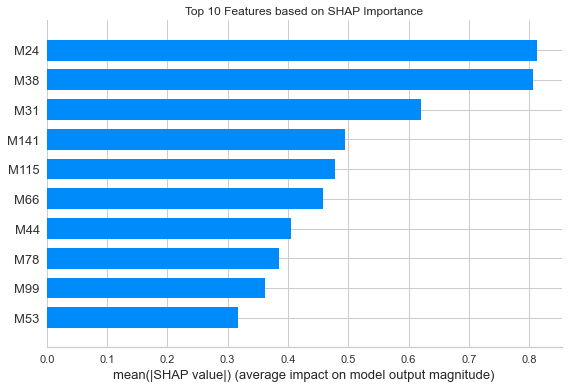

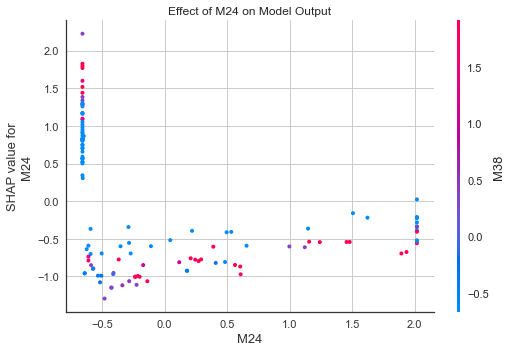

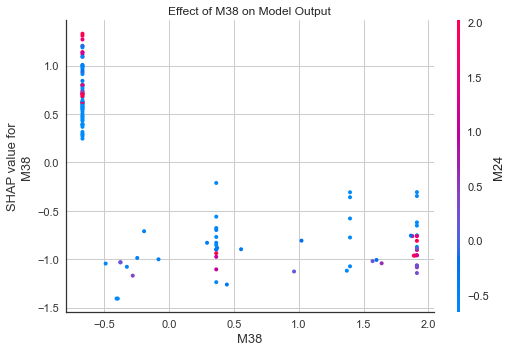

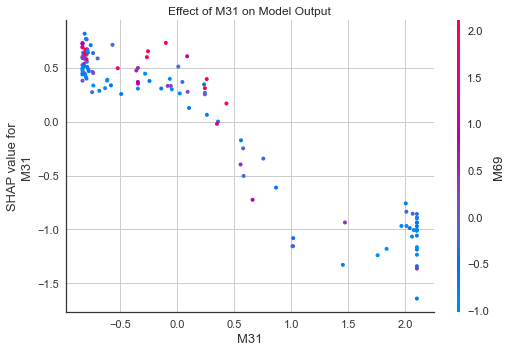

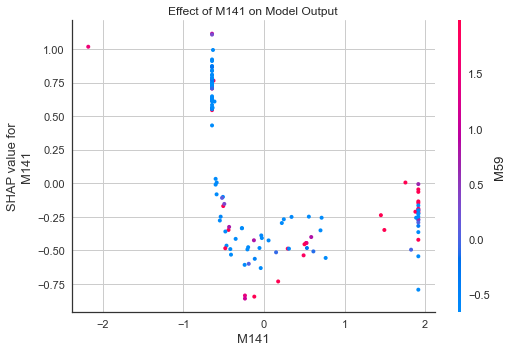

...

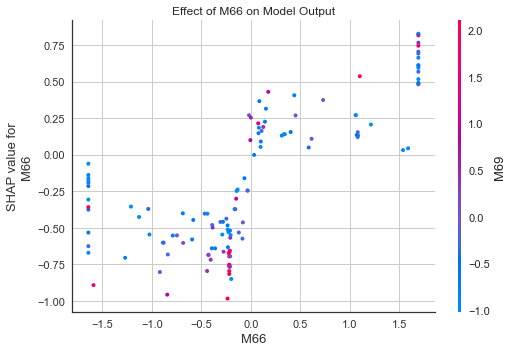

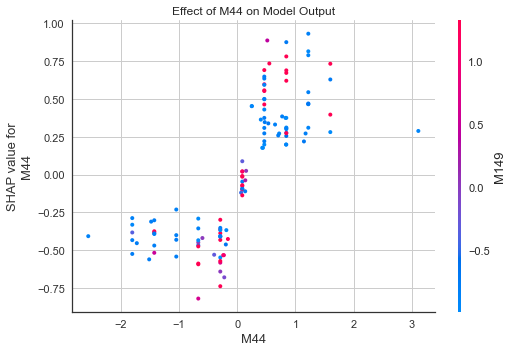

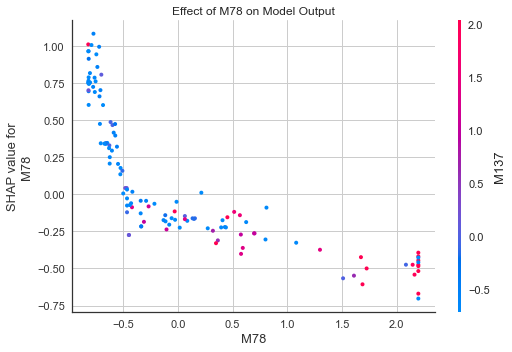

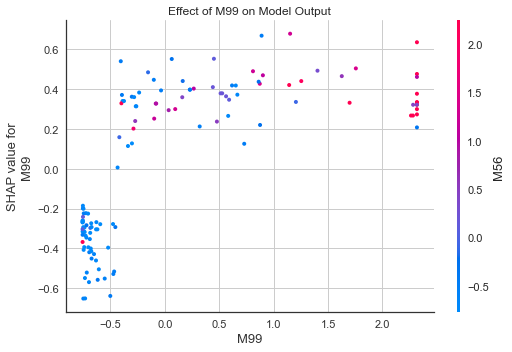

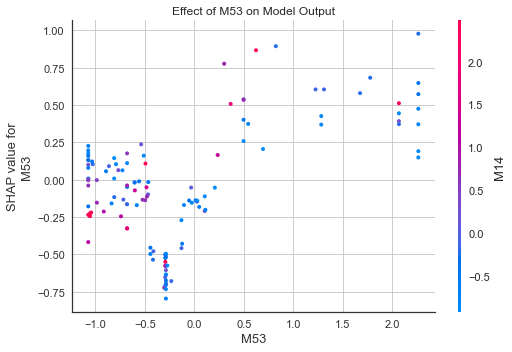

In [330]:
# train an XGBoost model on the training data
model = xgb.XGBClassifier()
model.fit(X_train, y_train)

# use SHAP to interpret the model
explainer = shap.Explainer(model)
shap_values = explainer.shap_values(X_test)
# get the top 10 features based on their SHAP importance values
top10_idx = (-np.abs(shap_values).mean(0)).argsort()[:10]
top10_features = X_train.columns[top10_idx]

# plot the SHAP values for the top 10 features
shap.summary_plot(shap_values, X_test, plot_type='bar', feature_names=X_test.columns, max_display=len(top10_features), show=False)
plt.title("Top 10 Features based on SHAP Importance")
plt.tight_layout()
plt.show()

# plot the SHAP values for each of the top 10 features
for feature in top10_features:
    shap.dependence_plot(feature, shap_values, X_test, show=False)
    plt.title(f"Effect of {feature} on Model Output")
    plt.tight_layout()
    plt.show()

Insights:

> First Plot is Best features plot - Top 10 features that explains maximum variation in Target Variable are:

        1. M24
        2. M38
        3. M31
        4. M141
        5. M115
        6. M66
        7. M44
        8. M78
        9. M99
        10. M53
        
        
> Second plot is SHAP Dependency Plot of top 10 features.
> SHAP dependency plot is very useful plot in understanding the effect of single feature accross entire dataset. In addition to that, it will also help in finding out any interaction effect present in the features. It shows the negative and Positive Impact.

# Fit Best Model on OOT Data

In [292]:
# Extract predicted probabilities for the test set
y_pred_proba = best_model.predict_proba(OOT_data)

# Extract probabilities of positive class (class 1)
y_pred_proba[:,1]

array([0.9955206 , 0.21054369, 0.9217037 , 0.8657554 , 0.04756331,
       0.02979966, 0.99656445, 0.7001842 , 0.94624215, 0.99882084,
       0.97832435, 0.7403635 , 0.7439141 , 0.0084162 , 0.95562303,
       0.873928  , 0.05715518, 0.9947207 , 0.9524598 , 0.87703174,
       0.80410165, 0.9624334 , 0.03202908, 0.9905667 , 0.27282017,
       0.02125045, 0.01264028, 0.25985673, 0.98065156, 0.66985464,
       0.9967212 , 0.8960166 , 0.9522348 , 0.8572983 , 0.82925045,
       0.40604454, 0.96950924, 0.34403318, 0.7202057 , 0.1251295 ,
       0.9876028 , 0.90845686, 0.12452372, 0.48257527, 0.00726525,
       0.28092107, 0.17625712, 0.24245451, 0.99215174, 0.5518181 ,
       0.4122675 , 0.91125125, 0.578977  , 0.451489  , 0.8115634 ,
       0.05329459, 0.74460703, 0.9744325 , 0.9914664 , 0.39599106,
       0.06295386, 0.90681165, 0.9233917 , 0.05836564, 0.8939088 ,
       0.94576466, 0.897185  , 0.6310567 , 0.42886114, 0.98143655,
       0.9957321 , 0.9809676 , 0.40653157, 0.99010986, 0.96342

In [293]:
len(y_pred_proba[:,1])

88

##  Submission of the Excel

In [296]:
sno = list(range(0, len(OOT_data)))
submission_df = pd.DataFrame({'S.No.': sno})
submission_df['predict_prob'] = y_pred_proba[:, 1]
submission_df.head(), submission_df.shape

(   S.No.  predict_prob
 0      0      0.995521
 1      1      0.210544
 2      2      0.921704
 3      3      0.865755
 4      4      0.047563,
 (88, 2))

In [299]:
submission_df.to_excel('Vaibhav_Arora_070423_OOT_prediction.xlsx', index=False)

<center> <h1> THANK YOU